<img src="http://imgur.com/1ZcRyrc.png" style="float: left; margin: 20px; height: 55px">

# Project 2: Ames Housing Pricing Prediction

## Contents:
- [Background](#Background)
- [Problem Statement](#Problem-Statement)
- [Data Import](#Data-Import)
- [Create Functions For Use Later](#Create-Functions-For-Use-Later)
- [Data Cleaning](#Data-Cleaning)
- [Feature Engineering](#Feature-Engineering)
- [Exploratory Data Analysis (EDA): Numerical Variables](#Exploratory-Data-Analysis-(EDA):-Numerical-Variables)
- [Exploratory Data Analysis (EDA): Categorical Variables](#Exploratory-Data-Analysis-(EDA):-Categorical-Variables)
- [Model Preparation](#Model-Preparation)
- [Modeling](#Modeling)
- [Repeat Data Cleaning for Test dataset](#Repeat-Data-Cleaning-for-Test-dataset)
- [Recommendations, Next Steps and Conclusion](#Recommendations,-Next-Steps-and-Conclusion)

## Background

Properties such as houses are amongst an individual's or a family's major financial committment and investment. It also signifies the attainment of a major milestone in life. Since sellers would aim to maximise sales price while buyers would aim to minimse sales price, most Ames homeowners would desire knowing the fair value of their property and ways to maximise their home sales prices. Additionally, opportunities are ample for homeowners to capitalize on potential asymmetries in information availability.

As your data-driven property consultant in Ames Iowa, I endeavour to build a house price prediction model using historical property transactions from Ames Iowa and subsequently advise you on both the property's fair value and the maximum historically transacted prices by neighbourhoods in Ames Iowa so you could make informed decisions.

## Problem Statement

Develop **3 models** (Linear Regression, Lasso Regression, and Ridge Regression) based on the **Ames Housing Dataset**, narrowing down to **1 production model** based on the **lowest [Root Mean Square Error (RMSE)](https://en.wikipedia.org/wiki/Root-mean-square_deviation)** to predict house sales prices for Ames homeowners and advice ways to maximise sales prices as your data-driven property consultant.

### Dataset Used
Data set containing information from the Ames, Iowa Assessor’s Office will used in computing assessed values for individual residential properties sold in Ames, IA from 2006 to 2010.

- **`train.csv`**: 2051 house transactions with 81 house features comprising 22 nominal (categorical features with no particular order), 24 ordinal (categorical features with ordering), 15 discrete (countable numerical features) and 20 continuous variables (uncountably infinite numerical features)
- **`test.csv`**: 878 properties with 80 house features for house price prediction

Refer to the [data dictionary](http://jse.amstat.org/v19n3/decock/DataDocumentation.txt) for details.

## Data Import
---

In [1]:
# Import all relevant libraries
import numpy as np
import pandas as pd
import patsy
import seaborn as sns
import matplotlib
import matplotlib.pyplot as plt
import statistics
from matplotlib.gridspec import GridSpec
from sklearn.linear_model import Ridge, Lasso, ElasticNet, LinearRegression, RidgeCV, LassoCV, ElasticNetCV
from sklearn.preprocessing import LabelEncoder, PolynomialFeatures, StandardScaler
from sklearn.model_selection import train_test_split, cross_val_score, cross_val_predict
from sklearn import metrics
from sklearn.experimental import enable_iterative_imputer 
from sklearn.impute import IterativeImputer
from sklearn.neighbors import KNeighborsClassifier

# Set random seed
np.random.seed(42)

# Initialise default library settings
pd.set_option("display.max_columns", 120)            # Set pandas to display ≤ 120 columns (None = unlimited columns)
pd.set_option("display.max_rows", 161)               # Set pandas to display ≤ 161 rows    (None = unlimited rows)
pd.set_option('display.precision', 2)                # Use 2 decimal places in output display
pd.set_option('display.expand_frame_repr', False)    # Don't wrap repr (DataFrame) across additional lines

# Switch to seaborn defaults
sns.set_theme()
sns.set(font_scale = 1.8)

import warnings
warnings.filterwarnings('ignore')

%config InlineBackend.figure_format = 'retina'
%matplotlib inline

## Create Functions For Use Later
---

In [2]:
# Function to replace all spaces in each column name with underscores & change column names to lowercase
def rename_col(df):
    
    df.columns = df.columns.str.replace(' ', '_')          # Replace all spaces in each column name with underscores
    df = df.rename(columns = str.lower, inplace = True)    # Change column names to lowercase
    
    return




# Function to compare all rows in dataset to check for duplicated rows
def duplicate(df):
    
    if len(df[df.duplicated()]) == 0:
        return "This dataset has no duplicated rows."
    else:
        print(f'Duplicated row(s):\n {df[df.duplicated()]}')  # List duplicated row(s) in dataset, if any
    
    return




# Function to check each column of selected dataset for nulls &
# Display summary table of all columns with at least 1 null, number of nulls & % Total number of rows  
def column_nulls(df):
    
    null = df.isnull().sum()
    null_percent = 100 * df.isnull().sum() / len(df)
    null_table = pd.concat([null, null_percent], axis = 1)
    null_table_ren_columns = null_table.rename(columns = {0 : 'Number of Nulls', 1 : '% of Total'})
    null_table_ren_columns = null_table_ren_columns[
        null_table_ren_columns.iloc[:,1] != 0].sort_values('% of Total', ascending = False).round(2)
    
    print ("This dataframe has " + str(df.shape[0]) + " rows and " + str(df.shape[1]) + " columns.\n"
           "There are " + str(null_table_ren_columns.shape[0]) + " columns with null values.")
    
    return null_table_ren_columns




# Function to retrieve all categorical data columns from dataset
def get_cat_var(df):
    cat_var = []
    for variable in df:
        if df[variable].dtype == object:
            cat_var.append(variable)
        else:
            pass
    return cat_var




# Function to retrieve all numerical data columns from dataset
def get_num_var(df):
    num_var = []
    for variable in df:
        if df[variable].dtype != object:
            num_var.append(variable)
        else:
            pass
    return num_var




# Function to display summary table of each unique column value & % Total number of rows in selected dataset   
def column_values(df, col):
    
    value = df[col].value_counts(dropna = False)
    value_percent = round(100 * df[col].value_counts(dropna = False) / len(df[col]), 2)
    value_table = pd.concat([value, value_percent], axis = 1)
    value_table.columns = ['Count', '% of Total']
    
    return value_table




# Function to display numerical variables in subplots triplets of histogram, boxplot & linear regression 
def plot_num(df, columns):
    
    nrows = len(columns)
    fig, ax = plt.subplots(nrows = nrows, ncols = 3, figsize = (15, 80), squeeze = False)
    ax = ax.ravel()

    
    plt.subplots_adjust(hspace = 0.5)
    sns.boxplot(patch_artist = True)
    
    for i, col in enumerate(columns):
        sns.histplot(x = df[col], ax = ax[i * 3], color = 'green', kde = True)
        ax[i * 3].axvline(df[col].mean(), color = 'red', lw = 2)
        ax[i * 3].axvline(df[col].median(), color = 'blue', ls = '--', lw = 2)
        ax[i * 3].set_title(f'{col.capitalize()}\'s Histogram', 
                            y = 1.02, fontsize = 18 , fontweight = 'bold')


    for i, col in enumerate(columns):
        sns.boxplot(x = df[col], ax = ax[1 + (i * 3)], #showbox = True, patch_artist = True, 
                    boxprops = dict(facecolor = 'black', color = 'orange'), capprops = dict(color = 'black'), 
                    flierprops = dict(color = 'black', markeredgecolor = 'black'), 
                    medianprops = dict(color = 'red'), whiskerprops = dict(color = 'black'))
        ax[1 + (i * 3)].set_title(f'{col.capitalize()}\'s Box Plot', 
                                  y = 1.02, fontsize = 18 , fontweight = 'bold')


    for i, col in enumerate(columns):
        sns.regplot(x = df[col], y = df['saleprice'], ax = ax[2 + (i * 3)], ci = None, line_kws = {'color': 'red'})
        ax[2 + (i * 3)].set_title(f'{col.capitalize()} vs \'Saleprice\' Scatter Plot', 
                                  y = 1.02, fontsize = 18 , fontweight = 'bold')

    plt.tight_layout()

# plot_num(train, train_num)




# Function to display categorical variables in subplots pairs of countplot & boxplot 
def plot_cat(df, cat_list):
    
    nrows = len(cat_list)
    fig, ax = plt.subplots(nrows = nrows, ncols = 2, figsize = (15, 300))    # 20, 300
    ax = ax.ravel()
    
    plt.subplots_adjust(hspace = 0.5)
    
#    gs = GridSpec(1, 2, width_ratios = [1, 2], height_ratios = [4, 1])
    
    for i, col in enumerate(cat_list):
        sns.countplot(y = col, data = df, ax = ax[i * 2], palette = 'Paired_r')    # palette = 'RdBu'
        ax[i * 2].set_title(f'{col.capitalize()}\'s Count Plot', 
                            y = 1.02, fontsize = 18 , fontweight = 'bold')
        ax[i * 2].set_xlim(1, 2050)
        ax[i * 2].axvline(1624, c = 'b')

    for i, col in enumerate(cat_list):
        sns.boxplot(x = df['saleprice'], y = df[col], ax = ax[1 + (i * 2)], palette = 'Paired_r')    # palette = 'RdBu'
        ax[1 + (i * 2)].set_title(f'{col.capitalize()} v \'Saleprice\' Box Plot', 
                                  y = 1.02, fontsize = 18 , fontweight = 'bold')

    plt.tight_layout()

# plot_cat(train, train_cat)

In [3]:
# Import Train dataset, rename column names and display number of rows & columns
train = pd.read_csv('../datasets/train.csv')
rename_col(train)
train.rename(columns = {'year_remod/add': 'year_remod'}, inplace = True)
train.shape

(2051, 81)

In [4]:
# Display first 5 rows of Train dataset
train.head()

,id,pid,ms_subclass,ms_zoning,lot_frontage,lot_area,street,alley,lot_shape,land_contour,utilities,lot_config,land_slope,neighborhood,condition_1,condition_2,bldg_type,house_style,overall_qual,overall_cond,year_built,year_remod,roof_style,roof_matl,exterior_1st,exterior_2nd,mas_vnr_type,mas_vnr_area,exter_qual,exter_cond,foundation,bsmt_qual,bsmt_cond,bsmt_exposure,bsmtfin_type_1,bsmtfin_sf_1,bsmtfin_type_2,bsmtfin_sf_2,bsmt_unf_sf,total_bsmt_sf,heating,heating_qc,central_air,electrical,1st_flr_sf,2nd_flr_sf,low_qual_fin_sf,gr_liv_area,bsmt_full_bath,bsmt_half_bath,full_bath,half_bath,bedroom_abvgr,kitchen_abvgr,kitchen_qual,totrms_abvgrd,functional,fireplaces,fireplace_qu,garage_type,garage_yr_blt,garage_finish,garage_cars,garage_area,garage_qual,garage_cond,paved_drive,wood_deck_sf,open_porch_sf,enclosed_porch,3ssn_porch,screen_porch,pool_area,pool_qc,fence,misc_feature,misc_val,mo_sold,yr_sold,sale_type,saleprice
0,109,533352170,60,RL,NaN,13517,Pave,NaN,IR1,Lvl,AllPub,CulDSac,Gtl,Sawyer,RRAe,Norm,1Fam,2Story,6,8,1976,2005,Gable,CompShg,HdBoard,Plywood,BrkFace,289.0,Gd,TA,CBlock,TA,TA,No,GLQ,533.0,Unf,0.0,192.0,725.0,GasA,Ex,Y,SBrkr,725,754,0,1479,0.0,0.0,2,1,3,1,Gd,6,Typ,0,NaN,Attchd,1976.0,RFn,2.0,475.0,TA,TA,Y,0,44,0,0,0,0,NaN,NaN,NaN,0,3,2010,WD,130500
1,544,531379050,60,RL,43.0,11492,Pave,NaN,IR1,Lvl,AllPub,CulDSac,Gtl,SawyerW,Norm,Norm,1Fam,2Story,7,5,1996,1997,Gable,CompShg,VinylSd,VinylSd,BrkFace,132.0,Gd,TA,PConc,Gd,TA,No,GLQ,637.0,Unf,0.0,276.0,913.0,GasA,Ex,Y,SBrkr,913,1209,0,2122,1.0,0.0,2,1,4,1,Gd,8,Typ,1,TA,Attchd,1997.0,RFn,2.0,559.0,TA,TA,Y,0,74,0,0,0,0,NaN,NaN,NaN,0,4,2009,WD,220000
2,153,535304180,20,RL,68.0,7922,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,NAmes,Norm,Norm,1Fam,1Story,5,7,1953,2007,Gable,CompShg,VinylSd,VinylSd,None,0.0,TA,Gd,CBlock,TA,TA,No,GLQ,731.0,Unf,0.0,326.0,1057.0,GasA,TA,Y,SBrkr,1057,0,0,1057,1.0,0.0,1,0,3,1,Gd,5,Typ,0,NaN,Detchd,1953.0,Unf,1.0,246.0,TA,TA,Y,0,52,0,0,0,0,NaN,NaN,NaN,0,1,2010,WD,109000
3,318,916386060,60,RL,73.0,9802,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,Timber,Norm,Norm,1Fam,2Story,5,5,2006,2007,Gable,CompShg,VinylSd,VinylSd,None,0.0,TA,TA,PConc,Gd,TA,No,Unf,0.0,Unf,0.0,384.0,384.0,GasA,Gd,Y,SBrkr,744,700,0,1444,0.0,0.0,2,1,3,1,TA,7,Typ,0,NaN,BuiltIn,2007.0,Fin,2.0,400.0,TA,TA,Y,100,0,0,0,0,0,NaN,NaN,NaN,0,4,2010,WD,174000
4,255,906425045,50,RL,82.0,14235,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,SawyerW,Norm,Norm,1Fam,1.5Fin,6,8,1900,1993,Gable,CompShg,Wd Sdng,Plywood,None,0.0,TA,TA,PConc,Fa,Gd,No,Unf,0.0,Unf,0.0,676.0,676.0,GasA,TA,Y,SBrkr,831,614,0,1445,0.0,0.0,2,0,3,1,TA,6,Typ,0,NaN,Detchd,1957.0,Unf,2.0,484.0,TA,TA,N,0,59,0,0,0,0,NaN,NaN,NaN,0,3,2010,WD,138500


## Data Cleaning
---

During data cleaning, feature engineering, and Exploratory Data Analysis (EDA), the following steps will be taken:

- [Check for duplicated rows](#Check-for-duplicated-rows)
- [Check for appropriate datatypes](#Check-for-appropriate-datatypes)
- [Initial check for missing/null values](#Initial-check-for-missing/null-values)
- [Drop rows with 1 or 2 missing/null values](#Drop-rows-with-1-or-2-missing/null-values)
- [Check for missing/null values](#Check-for-missing/null-values)
- [Check for obvious outliers](#Check-for-obvious-outliers)
- [Impute missing/null values](#Impute-missing/null-values)
  - [Drop 17 rows corresponding to 17 properties to be removed](#Drop-17-rows-corresponding-to-17-properties-to-be-removed)
  - [Impute values](#Impute-values)
- [Feature Engineering](#Feature-Engineering)
  - [Total property area in square feet [`'total_pty_sf'`]](#Total-property-area-in-square-feet-['total_pty_sf'])
  - [Age of garage at year of sale [`'garage_age'`]](#Age-of-garage-at-year-of-sale-['garage_age'])
  - [Age of house at year of sale [`'house_age'`]](#Age-of-house-at-year-of-sale-['house_age'])
  - [Sanity Check](#Sanity-Check)
- [Exploratory Data Analysis (EDA): Numerical Variables](#Exploratory-Data-Analysis-(EDA):-Numerical-Variables)
  - [Correlation Analysis (I)](#Correlation-Analysis-(I))
- [Exploratory Data Analysis (EDA): Categorical Variables](#Exploratory-Data-Analysis-(EDA):-Categorical-Variables)
  - [Preprocess ordinal categorical variables — Integer Encoding](#Preprocess-ordinal-categorical-variables-—-Integer-Encoding)
  - [Correlation Analysis (II)](#Correlation-Analysis-(II))
  - [Preprocess nominal categorical variables — Dummy Variable Encoding](#Preprocess-nominal-categorical-variables-—-Dummy-Variable-Encoding)

### Check for duplicated rows

In [5]:
# Compare all rows in the Train dataset to check for duplicates
duplicate(train)

'This dataset has no duplicated rows.'

### Check for appropriate datatypes

In [6]:
# Check data types for each column of the Train dataset
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2051 entries, 0 to 2050
Data columns (total 81 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   id               2051 non-null   int64  
 1   pid              2051 non-null   int64  
 2   ms_subclass      2051 non-null   int64  
 3   ms_zoning        2051 non-null   object 
 4   lot_frontage     1721 non-null   float64
 5   lot_area         2051 non-null   int64  
 6   street           2051 non-null   object 
 7   alley            140 non-null    object 
 8   lot_shape        2051 non-null   object 
 9   land_contour     2051 non-null   object 
 10  utilities        2051 non-null   object 
 11  lot_config       2051 non-null   object 
 12  land_slope       2051 non-null   object 
 13  neighborhood     2051 non-null   object 
 14  condition_1      2051 non-null   object 
 15  condition_2      2051 non-null   object 
 16  bldg_type        2051 non-null   object 
 17  house_style   

The following 3 columns in the Train dataset are categorical / qualitative data but were classified as numerical / quantitative data instead:
 - `'ms_subclass'`: (Nominal) Identifies the type of dwelling involved in the sale
 - `'overall_qual'`: (Ordinal) Rates the overall material and finish of the house
 - `'overall_cond'`: (Ordinal) Rates the overall condition of the house
 
While `'mo_sold'` was classified as numerical / quantitative data, it is more meaningful interpreted as categorical/qualitative data contextually:
 - `'mo_sold'`: (Discrete) Month Sold (MM)

In [7]:
# Change datatype for 4 columns 'ms_subclass', 'overall_qual', 'overall_cond', and 'mo_sold' to string instead
train = train.astype({'ms_subclass': str, 'overall_qual': str, 'overall_cond': str, 'mo_sold': str}, 
                     errors = 'raise')

# Verify datatype for these 4 columns have been changed
print(train['ms_subclass'].dtype)
print(train['overall_qual'].dtype)
print(train['overall_cond'].dtype)
print(train['mo_sold'].dtype)

object
object
object
object


### Initial check for missing/null values

In [8]:
# Check Train dataset for nulls & display summary table in descending order (for columns with non-zero nulls only)
column_nulls(train)

This dataframe has 2051 rows and 81 columns.
There are 26 columns with null values.


,Number of Nulls,% of Total
pool_qc,2042,99.56
misc_feature,1986,96.83
alley,1911,93.17
fence,1651,80.50
fireplace_qu,1000,48.76
lot_frontage,330,16.09
garage_yr_blt,114,5.56
garage_cond,114,5.56
garage_qual,114,5.56
garage_finish,114,5.56


### Drop rows with 1 or 2 missing/null values

In [9]:
# Drop rows with merely 1 or 2 missing/null values in the following columns
train = train.dropna(how = 'any', subset = ['bsmt_half_bath', 'bsmt_full_bath', 'bsmt_unf_sf', 'bsmtfin_sf_2', 
                                            'garage_cars', 'garage_area', 'bsmtfin_sf_1', 'total_bsmt_sf'])
train.reset_index(drop = True, inplace = True)    # Permanently reset index of dataframe

### Check for missing/null values

In [10]:
# Check Train dataset for nulls & display summary table in descending order (for columns with non-zero nulls only)
column_nulls(train)

This dataframe has 2048 rows and 81 columns.
There are 18 columns with null values.


,Number of Nulls,% of Total
pool_qc,2039,99.56
misc_feature,1983,96.83
alley,1908,93.16
fence,1650,80.57
fireplace_qu,998,48.73
lot_frontage,330,16.11
garage_type,113,5.52
garage_yr_blt,113,5.52
garage_finish,113,5.52
garage_qual,113,5.52


In [11]:
# Pool QC (Ordinal): Pool quality
# NA: No Pool (2039)
# Additionally, the corresponding 2039 'pool_area' values for these same rows are also '0'.
# Pool Area (Continuous): Pool area in square feet

# Count the number of rows that 'pool_area' is '0' and 'pool_qc' has null values
((train['pool_area'] == 0) & (train['pool_qc'].isna())).sum()

2039

> Merely **9** ( = 2048 - 2039 ) out of the 2048 (i.e. **0.44%**) properties in the Train dataset have pool(s).

In [12]:
# Misc Feature (Nominal): Miscellaneous feature not covered in other categories
# NA: None (1983)
# Additionally, the corresponding 1983 'misc_val' values for these same rows are also '0'.
#Misc Val (Continuous): $Value of miscellaneous feature

# Count the number of rows that 'misc_val' is '0' and 'misc_feature' has null values
((train['misc_val'] == 0) & (train['misc_feature'].isna())).sum()

1983

> Merely **65** ( = 2048 - 1983 ) out of the 2048 (i.e. **3.17%**) properties in the Train dataset have miscellaneous feature(s) not covered in other categories.

In [13]:
# Alley (Nominal): Type of alley access to property
# NA: No alley access (1908)
train['alley'].isna().sum()

1908

> Merely **140** ( = 2048 - 1908 ) out of the 2048 (i.e. **6.83%**) properties in the Train dataset have alley access to property.

In [14]:
# Fence (Ordinal): Fence quality
# NA: No Fence (1650)
train['fence'].isna().sum()

1650

> Merely **398** ( = 2048 - 1650 ) out of the 2048 (i.e. **19.43%**) properties in the Train dataset have fence(s).

Permanently drop the `'pid'` column since it is more for recordkeeping purpose, and will not influence house pricing.
 
Permanently drop the following 4 columns since majority of the properties in the Train dataset do not have pools, miscellaneous feature not covered in other categories, alley access to property, or fences:
 - `'pool_qc'`
 - `'misc_feature'`
 - `'alley'`
 - `'fence'`

In [15]:
# Permanently drop the following 5 columns:
train = train.drop(['pid', 'pool_qc', 'misc_feature', 'alley', 'fence'], axis = 1)

# Verify these 5 columns have been dropped
train.shape

(2048, 76)

### Check for obvious outliers 

Text(0, 0.5, 'Sale Price ($)')

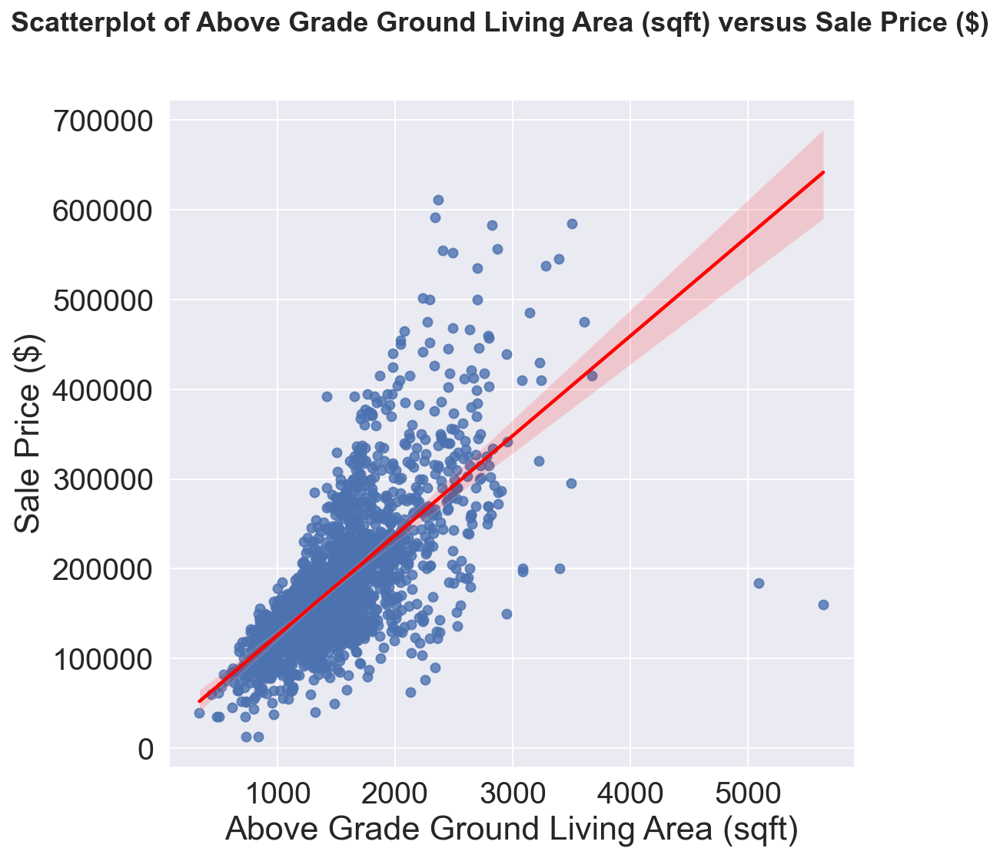

In [16]:
# Plot scatterplot of 'gr_liv_area' vs 'saleprice' to identify & remove obvious outliers, if any
fig, axes = plt.subplots(1, 1, figsize = (8, 8))
fig.suptitle('Scatterplot of Above Grade Ground Living Area (sqft) versus Sale Price ($)', 
                 fontsize = 18, fontweight = 'bold')

fig = sns.regplot(data = train, x = 'gr_liv_area', y = 'saleprice', line_kws = {'color': 'red'})

# Setting the labels
fig.set_xlabel('Above Grade Ground Living Area (sqft)')
fig.set_ylabel('Sale Price ($)')

> 2 exceptionally large houses with Ground Living Area > 5,000 sqft that are sold at relatively lower prices are identified as obvious outliers to be removed.

In [17]:
# Remove 2 exceptionally large houses with Ground Living Area > 5,000 sqft sold at relatively lower prices
train = train[train['gr_liv_area'] < 5000]
train.reset_index(drop = True, inplace = True)    # Permanently reset index of dataframe
train.shape

(2046, 76)

### Impute missing/null values

In [18]:
train[train['lot_area'].isnull()]

,id,ms_subclass,ms_zoning,lot_frontage,lot_area,street,lot_shape,land_contour,utilities,lot_config,land_slope,neighborhood,condition_1,condition_2,bldg_type,house_style,overall_qual,overall_cond,year_built,year_remod,roof_style,roof_matl,exterior_1st,exterior_2nd,mas_vnr_type,mas_vnr_area,exter_qual,exter_cond,foundation,bsmt_qual,bsmt_cond,bsmt_exposure,bsmtfin_type_1,bsmtfin_sf_1,bsmtfin_type_2,bsmtfin_sf_2,bsmt_unf_sf,total_bsmt_sf,heating,heating_qc,central_air,electrical,1st_flr_sf,2nd_flr_sf,low_qual_fin_sf,gr_liv_area,bsmt_full_bath,bsmt_half_bath,full_bath,half_bath,bedroom_abvgr,kitchen_abvgr,kitchen_qual,totrms_abvgrd,functional,fireplaces,fireplace_qu,garage_type,garage_yr_blt,garage_finish,garage_cars,garage_area,garage_qual,garage_cond,paved_drive,wood_deck_sf,open_porch_sf,enclosed_porch,3ssn_porch,screen_porch,pool_area,misc_val,mo_sold,yr_sold,sale_type,saleprice


In [19]:
train[train['lot_frontage'].isnull()]

,id,ms_subclass,ms_zoning,lot_frontage,lot_area,street,lot_shape,land_contour,utilities,lot_config,land_slope,neighborhood,condition_1,condition_2,bldg_type,house_style,overall_qual,overall_cond,year_built,year_remod,roof_style,roof_matl,exterior_1st,exterior_2nd,mas_vnr_type,mas_vnr_area,exter_qual,exter_cond,foundation,bsmt_qual,bsmt_cond,bsmt_exposure,bsmtfin_type_1,bsmtfin_sf_1,bsmtfin_type_2,bsmtfin_sf_2,bsmt_unf_sf,total_bsmt_sf,heating,heating_qc,central_air,electrical,1st_flr_sf,2nd_flr_sf,low_qual_fin_sf,gr_liv_area,bsmt_full_bath,bsmt_half_bath,full_bath,half_bath,bedroom_abvgr,kitchen_abvgr,kitchen_qual,totrms_abvgrd,functional,fireplaces,fireplace_qu,garage_type,garage_yr_blt,garage_finish,garage_cars,garage_area,garage_qual,garage_cond,paved_drive,wood_deck_sf,open_porch_sf,enclosed_porch,3ssn_porch,screen_porch,pool_area,misc_val,mo_sold,yr_sold,sale_type,saleprice
0,109,60,RL,NaN,13517,Pave,IR1,Lvl,AllPub,CulDSac,Gtl,Sawyer,RRAe,Norm,1Fam,2Story,6,8,1976,2005,Gable,CompShg,HdBoard,Plywood,BrkFace,289.0,Gd,TA,CBlock,TA,TA,No,GLQ,533.0,Unf,0.0,192.0,725.0,GasA,Ex,Y,SBrkr,725,754,0,1479,0.0,0.0,2,1,3,1,Gd,6,Typ,0,NaN,Attchd,1976.0,RFn,2.0,475.0,TA,TA,Y,0,44,0,0,0,0,0,3,2010,WD,130500
7,145,20,RL,NaN,12160,Pave,IR1,Lvl,AllPub,Inside,Gtl,NAmes,Norm,Norm,1Fam,1Story,5,5,1959,1959,Hip,CompShg,Plywood,Plywood,BrkFace,180.0,TA,TA,CBlock,TA,TA,No,Rec,1000.0,Unf,0.0,188.0,1188.0,GasA,Fa,Y,SBrkr,1188,0,0,1188,1.0,0.0,1,0,3,1,TA,6,Typ,0,NaN,Attchd,1959.0,RFn,2.0,531.0,TA,TA,Y,0,0,0,0,0,0,0,5,2010,COD,142000
8,1942,20,RL,NaN,15783,Pave,Reg,Lvl,AllPub,Inside,Gtl,OldTown,Artery,Norm,1Fam,1Story,5,5,1952,1952,Gable,CompShg,Wd Sdng,Wd Sdng,None,0.0,TA,TA,CBlock,TA,TA,No,Rec,292.0,Unf,0.0,632.0,924.0,GasA,TA,Y,SBrkr,924,0,0,924,0.0,0.0,1,0,2,1,TA,6,Typ,0,NaN,Detchd,1952.0,Unf,1.0,420.0,TA,TA,Y,0,324,0,0,0,0,400,6,2007,WD,112500
23,12,20,RL,NaN,7980,Pave,IR1,Lvl,AllPub,Inside,Gtl,Gilbert,Norm,Norm,1Fam,1Story,6,7,1992,2007,Gable,CompShg,HdBoard,HdBoard,None,0.0,TA,Gd,PConc,Gd,TA,No,ALQ,935.0,Unf,0.0,233.0,1168.0,GasA,Ex,Y,SBrkr,1187,0,0,1187,1.0,0.0,2,0,3,1,TA,6,Typ,0,NaN,Attchd,1992.0,Fin,2.0,420.0,TA,TA,Y,483,21,0,0,0,0,500,3,2010,WD,185000
27,1534,50,RL,NaN,11700,Pave,IR1,HLS,AllPub,Inside,Mod,Crawfor,Norm,Norm,1Fam,1.5Fin,5,6,1937,1995,Gable,CompShg,WdShing,Wd Shng,None,0.0,TA,TA,CBlock,TA,TA,No,BLQ,606.0,Unf,0.0,336.0,942.0,GasA,Ex,Y,SBrkr,1265,673,0,1938,0.0,0.0,2,0,4,1,Gd,7,Min2,1,Gd,Detchd,1937.0,Unf,1.0,240.0,TA,TA,Y,0,40,0,0,0,0,0,7,2008,WD,198000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2011,560,20,RL,NaN,7791,Pave,IR1,Lvl,AllPub,Inside,Gtl,Sawyer,RRAe,Norm,1Fam,1Story,5,8,1963,1995,Gable,CompShg,Plywood,Plywood,None,0.0,Gd,Gd,CBlock,TA,TA,No,ALQ,624.0,Unf,0.0,288.0,912.0,GasA,Ex,Y,SBrkr,912,0,0,912,1.0,0.0,1,0,3,1,Gd,6,Typ,0,NaN,Attchd,1963.0,RFn,1.0,300.0,TA,TA,Y,0,0,0,0,0,0,0,10,2009,WD,129000
2017,2872,20,RL,NaN,16381,Pave,IR1,Lvl,AllPub,Inside,Gtl,Crawfor,Norm,Norm,1Fam,1Story,6,5,1969,1969,Gable,CompShg,Plywood,Plywood,BrkFace,312.0,Gd,Gd,CBlock,TA,TA,Av,Rec,1110.0,Unf,0.0,734.0,1844.0,GasA,Gd,Y,SBrkr,1844,0,0,1844,1.0,0.0,2,0,3,1,Gd,7,Typ,1,TA,Attchd,1969.0,RFn,2.0,540.0,TA,TA,Y,0,73,216,0,0,0,0,12,2006,WD,223000
2023,2526,20,RL,NaN,20781,Pave,IR2,Lvl,AllPub,CulDSac,Gtl,NWAmes,PosN,Norm,1Fam,1Story,7,7,1968,2003,Hip,CompShg,BrkFace,HdBoard,None,0.0,TA,TA,CBlock,TA,TA,No,BLQ,297.0,Rec,68.0,1203.0,1568.0,GasA,TA,Y,SBrkr,2156,0,0,2156,0.0,0.0,2,0,3,1,TA,9,Typ,1,Gd,Attchd,1968.0,RFn,2.0,508.0,Gd,TA,Y,0,80,0,290,0,0,0,6,2006,WD,262500
2026,25,20,RL,NaN,12537,Pave,IR1,Lvl,AllPub,CulDSac,Gtl,NAmes,Norm,Norm,1Fam,1Story,5,6,1971,2008,Gable,CompShg,VinylSd,VinylSd,None,0.0,TA,TA,CBlock,TA,TA,No,GLQ,734.0,Unf,0.0,344.0,1078.0,GasA,Ex,Y,SBrkr,1078,0,0,1078,1.0,0.

In [20]:
# Impute null values of 'lot_frontage' by estimating using Linear Regression of 'lot_area' with IterativeImputer
it_imp = IterativeImputer(estimator = LinearRegression())
it_imp_train = it_imp.fit_transform(train[['lot_area', 'lot_frontage']])
train[['lot_area', 'lot_frontage']] = pd.DataFrame(it_imp_train, 
                                                   columns = train[['lot_area', 'lot_frontage']].columns)
train['lot_frontage'].describe()

count    2046.00
mean       70.02
std        24.25
min        21.00
25%        60.00
50%        69.00
75%        80.00
max       456.80
Name: lot_frontage, dtype: float64

In [21]:
# Verify that all null values for 'lot_frontage' column have been imputed
train[train['lot_frontage'].isnull()]

,id,ms_subclass,ms_zoning,lot_frontage,lot_area,street,lot_shape,land_contour,utilities,lot_config,land_slope,neighborhood,condition_1,condition_2,bldg_type,house_style,overall_qual,overall_cond,year_built,year_remod,roof_style,roof_matl,exterior_1st,exterior_2nd,mas_vnr_type,mas_vnr_area,exter_qual,exter_cond,foundation,bsmt_qual,bsmt_cond,bsmt_exposure,bsmtfin_type_1,bsmtfin_sf_1,bsmtfin_type_2,bsmtfin_sf_2,bsmt_unf_sf,total_bsmt_sf,heating,heating_qc,central_air,electrical,1st_flr_sf,2nd_flr_sf,low_qual_fin_sf,gr_liv_area,bsmt_full_bath,bsmt_half_bath,full_bath,half_bath,bedroom_abvgr,kitchen_abvgr,kitchen_qual,totrms_abvgrd,functional,fireplaces,fireplace_qu,garage_type,garage_yr_blt,garage_finish,garage_cars,garage_area,garage_qual,garage_cond,paved_drive,wood_deck_sf,open_porch_sf,enclosed_porch,3ssn_porch,screen_porch,pool_area,misc_val,mo_sold,yr_sold,sale_type,saleprice


In [22]:
# FireplaceQu (Ordinal): Fireplace quality
# NA: No Fireplace (998)
# Additionally, the corresponding 998 'fireplaces' values for these same rows are also '0'.
# Fireplaces (Discrete): Number of fireplaces

# Count the number of rows that 'fireplaces' is '0' and 'fireplace_qu' has null values
((train['fireplaces'] == 0) & (train['fireplace_qu'].isna())).sum()

998

**Handling missing/null values:**
 - Since the **998** null values for `'fireplace_qu'` correspond to the same **998** properties without fireplaces, impute these null values to **None**.

In [23]:
# Garage Type (Nominal): Garage location
# NA: No Garage (113)
# Garage Cond (Ordinal): Garage condition
# NA: No Garage (113)
# Garage Finish (Ordinal) : Interior finish of the garage
# NA: No Garage (113)
# Garage Qual (Ordinal): Garage quality
# NA: No Garage (113)
# Additionally, the corresponding 113 'garage_area' values for these same rows are also '0'.
# Garage Area (Continuous): Size of garage in square feet

# Count the number of rows that 'garage_area' is '0' and 
# columns 'garage_type', 'garage_cond', 'garage_finish', and 'garage_qual' have null values
((train['garage_area'] == 0) & (train['garage_type'].isna()) & (train['garage_cond'].isna())
                             & (train['garage_finish'].isna()) & (train['garage_qual'].isna())).sum()

113

**Handling missing/null values:**
 - Since the **113** null values for columns `'garage_type'`, `'garage_cond'`, `'garage_finish'`, and `'garage_qual'` correspond to the same **113** properties without garages, impute these null values to **None**.

In [24]:
# Display selected columns for which 
# 'garage_cond', 'garage_finish', 'garage_qual', and 'garage_yr_blt' have null values
train.loc[train['garage_yr_blt'].isnull(), ['id', 'year_built', 'year_remod', 'yr_sold', 
                                            'garage_yr_blt', 'garage_area']]

,id,year_built,year_remod,yr_sold,garage_yr_blt,garage_area
28,2243,1895,2006,2007,NaN,0.0
53,330,1970,1970,2010,NaN,0.0
65,2278,2007,2007,2007,NaN,0.0
79,2235,1925,2003,2007,NaN,0.0
101,2084,1920,2002,2007,NaN,0.0
103,728,1900,1950,2009,NaN,0.0
114,781,1947,1950,2009,NaN,0.0
120,1492,1940,1969,2008,NaN,0.0
134,1514,1925,1950,2008,NaN,0.0
136,216,1875,1996,2010,NaN,0.0


**Handling missing/null values:**
 - Impute null values in column `'garage_yr_blt'` to the same corresponding value as that for column `'yr_sold'` such that `'garage_age'` ( = `'yr_sold'` - `'garage_yr_blt'`) to be feature engineered in subsequent steps is **0**.

In [25]:
# Display selected columns for which 'bsmt_exposure' has null values
train.loc[train['bsmt_exposure'].isnull(), ['id', 'bsmt_cond', 'bsmt_exposure', 'bsmt_full_bath', 'bsmt_half_bath', 
                                            'bsmt_qual', 'bsmt_unf_sf', 'bsmtfin_sf_1', 'bsmtfin_sf_2', 
                                            'bsmtfin_type_1', 'bsmtfin_type_2', 'total_bsmt_sf']]

,id,bsmt_cond,bsmt_exposure,bsmt_full_bath,bsmt_half_bath,bsmt_qual,bsmt_unf_sf,bsmtfin_sf_1,bsmtfin_sf_2,bsmtfin_type_1,bsmtfin_type_2,total_bsmt_sf
12,807,NaN,NaN,0.0,0.0,NaN,0.0,0.0,0.0,NaN,NaN,0.0
93,811,NaN,NaN,0.0,0.0,NaN,0.0,0.0,0.0,NaN,NaN,0.0
114,781,NaN,NaN,0.0,0.0,NaN,0.0,0.0,0.0,NaN,NaN,0.0
146,888,NaN,NaN,0.0,0.0,NaN,0.0,0.0,0.0,NaN,NaN,0.0
183,1554,NaN,NaN,0.0,0.0,NaN,0.0,0.0,0.0,NaN,NaN,0.0
240,2740,NaN,NaN,0.0,0.0,NaN,0.0,0.0,0.0,NaN,NaN,0.0
249,2242,NaN,NaN,0.0,0.0,NaN,0.0,0.0,0.0,NaN,NaN,0.0
256,2745,NaN,NaN,0.0,0.0,NaN,0.0,0.0,0.0,NaN,NaN,0.0
390,84,NaN,NaN,0.0,0.0,NaN,0.0,0.0,0.0,NaN,NaN,0.0
437,1501,NaN,NaN,0.0,0.0,NaN,0.0,0.0,0.0,NaN,NaN,0.0


**Observations:**
 - There are **56** properties with at least 1 column having null values.
 - Examining columns `'bsmt_unf_sf'`, `'bsmtfin_sf_1'`, `'bsmtfin_sf_2'`, and `'total_bsmt_sf'`:
   - **3** properties with **id 67, 1797, and 2780** have **unfinished basements** since both `'bsmt_unf_sf'` and `'total_bsmt_sf'` columns are **non-zero**.
   - Remaining **53** properties (i.e. excluding **id 67, 1797, and 2780**) have **no basements** since columns `'bsmt_unf_sf'`, `'bsmtfin_sf_1'`, `'bsmtfin_sf_2'`, and `'total_bsmt_sf'` are **0**.<br><br>


**Handling missing/null values:**
 - Drop the rows corresponding to the **3** properties with **id 67, 1797, and 2780**.
 - Impute null values to **None** for the remaining **53** properties for columns `'bsmt_exposure'`, `'bsmt_cond'`, `'bsmtfin_type_1'`, `'bsmtfin_type_2'`, and `'bsmt_qual'`.

In [26]:
# Display selected columns for which both 'mas_vnr_area' has null values
train.loc[train['mas_vnr_area'].isnull(), ['id', 'fireplaces', 'fireplace_qu', 'mas_vnr_area', 'mas_vnr_type']]

,id,fireplaces,fireplace_qu,mas_vnr_area,mas_vnr_type
22,2393,1,Gd,NaN,NaN
41,2383,1,Gd,NaN,NaN
86,539,0,NaN,NaN,NaN
212,518,0,NaN,NaN,NaN
276,2824,0,NaN,NaN,NaN
338,1800,1,Gd,NaN,NaN
431,1455,1,Gd,NaN,NaN
451,1120,1,Gd,NaN,NaN
591,1841,0,NaN,NaN,NaN
843,1840,0,NaN,NaN,NaN


**Observations:**
 - There are **22** properties with at least 1 column having null values.
 - Examining columns `'fireplaces'`, `'fireplace_qu'`, `'mas_vnr_area'`, and `'mas_vnr_type'`:
   - **8** properties (with **id 518, 539, 1123, 1128, 1728, 1840, 1841 and 2824**) have **no fireplaces** since `'fireplaces'` column is **0**.
   - Remaining **14** properties (i.e. excluding **id 518, 539, 1123, 1128, 1728, 1840, 1841 and 2824**) have **1** to **2** fireplaces, for which **5** of these properties have **Average** (Prefabricated Fireplace in main living area or Masonry Fireplace in basement) quality and the other **9** properties have **Good** (Masonry Fireplace in main level) quality.
   - These **14** properties' corresponding ids are **56, 485, 1096, 1120, 1185, 1455, 1752, 1784, 1800, 2230, 2261, 2383, 2393, and 2456**.

In [27]:
# Count number of properties with fireplaces
(train['fireplaces'] > 0).sum()

1048

**Handling missing/null values:**
 - Drop the remaining **14** properties with **id 56, 485, 1096, 1120, 1185, 1455, 1752, 1784, 1800, 2230, 2261, 2383, 2393, and 2456**, since these merely comprise **1.34%** ( = 100% X 14 / 1048 ) of all properties with at least 1 fireplace.
 - Impute null values of column `'mas_vnr_type'` to **None** for the **8** properties with **id 518, 539, 1123, 1128, 1728, 1840, 1841 and 2824**.
 - Impute null values of column `'mas_vnr_area'` to **0.0** for the **8** properties with **id 518, 539, 1123, 1128, 1728, 1840, 1841 and 2824**.

#### Drop 17 rows corresponding to 17 properties to be removed

In [28]:
# Drop the 17 properties highlighted above with 
# id 56, 67, 485, 1096, 1120, 1185, 1455, 1752, 1784, 1797, 1800, 2230, 2261, 2383, 2393, 2456, and 2780

ids_to_remove = [56, 67, 485, 1096, 1120, 1185, 1455, 1752, 1784, 1797, 1800, 2230, 2261, 2383, 2393, 2456, 2780]

# Checks & removes rows where the value in column 'id' of the Train dataset is in the list 'ids_to_remove'
train = train[~train.id.isin(ids_to_remove)]
train.reset_index(drop = True, inplace = True)    # Permanently reset index of dataframe
train.shape

(2029, 76)

#### Impute values

In [29]:
# Impute null values to 'None' for categorical variables or 0 for numerical variable
train['mas_vnr_type'] = train['mas_vnr_type'].fillna('None')
train['mas_vnr_area'] = train['mas_vnr_area'].fillna(0.0)
train['bsmt_qual'] = train['bsmt_qual'].fillna('None')
train['bsmt_cond'] = train['bsmt_cond'].fillna('None')
train['bsmt_exposure'] = train['bsmt_exposure'].fillna('None')
train['bsmtfin_type_1'] = train['bsmtfin_type_1'].fillna('None')
train['bsmtfin_type_2'] = train['bsmtfin_type_2'].fillna('None')
train['fireplace_qu'] = train['fireplace_qu'].fillna('None')
train['garage_type'] = train['garage_type'].fillna('None')
train['garage_finish'] = train['garage_finish'].fillna('None')
train['garage_qual'] = train['garage_qual'].fillna('None')
train['garage_cond'] = train['garage_cond'].fillna('None')

# Impute null value in 'garage_yr_blt' to the same value in the corresponding 'yr_sold' column
train['garage_yr_blt'].fillna(train['yr_sold'], inplace = True)

In [30]:
# Check Train dataset for nulls & display summary table in descending order (for columns with non-zero nulls only)
column_nulls(train)

This dataframe has 2029 rows and 76 columns.
There are 0 columns with null values.


,Number of Nulls,% of Total


> All null values have been imputed.

## Feature Engineering
---

### Total property area in square feet [`'total_pty_sf'`]
Total property area (Continuous) = Total Bsmt SF + Gr Liv Area + Garage Area + Wood Deck SF + Open Porch SF + Enclosed Porch + 3-Ssn Porch + Screen Porch + Pool Area

In [31]:
# Create new column ['total_pty_sf'] for total property area in square feet

# Total Bsmt SF (Continuous): Total square feet of basement area
# Gr Liv Area (Continuous): Above grade (ground) living area square feet
# Garage Area (Continuous): Size of garage in square feet
# Wood Deck SF (Continuous): Wood deck area in square feet
# Open Porch SF (Continuous): Open porch area in square feet
# Enclosed Porch (Continuous): Enclosed porch area in square feet
# 3-Ssn Porch (Continuous): Three season porch area in square feet
# Screen Porch (Continuous): Screen porch area in square feet
# Pool Area (Continuous): Pool area in square feet

# Observations from Train dataset:
# Gr Liv Area == 1st_flr_sf + 2nd_flr_sf + low_qual_fin_sf
# total_bsmt_sf ≥ bsmt_unf_sf

train['total_pty_sf'] = (train['total_bsmt_sf'] + train['gr_liv_area'] + train['garage_area'] + 
                         train['wood_deck_sf'] + train['open_porch_sf'] + train['enclosed_porch'] + 
                         train['3ssn_porch'] + train['screen_porch'] + train['pool_area'])

### Age of garage at year of sale [`'garage_age'`]
Age of Garage (Continuous) = Yr Sold - max(Year Remod/Add, Year Built)

In [32]:
# Create new column ['garage_age'] for age of garage at year of sale

# Yr Sold (Discrete): Year Sold (YYYY)
# Garage Yr Blt (Discrete): Year garage was built

train['garage_age'] = train['yr_sold'] - train['garage_yr_blt']

### Age of house at year of sale [`'house_age'`]
Age of House (Continuous) = Yr Sold - max(Year Remod/Add, Year Built)

In [33]:
# Create new column ['house_age'] for age of house at year of sale

# Yr Sold (Discrete): Year Sold (YYYY)
# Year Remod/Add (Discrete): Remodel date (same as construction date if no remodeling or additions)
# Year Built (Discrete): Original construction date

train['house_age'] = train['yr_sold'] - (train[['year_remod', 'year_built']].max(axis = 1))

### Sanity Check

In [34]:
# Verify all numerical variables have counts, means, standard deviations, mininum & maximum values that are logical
num_vars = get_num_var(train)
num_vars.remove('saleprice')
for variable in num_vars:
    print(train[variable].describe(), '\n')

count    2029.00
mean     1472.34
std       844.95
min         1.00
25%       751.00
50%      1479.00
75%      2195.00
max      2930.00
Name: id, dtype: float64 

count    2029.00
mean       69.93
std        24.26
min        21.00
25%        60.00
50%        69.00
75%        80.00
max       456.80
Name: lot_frontage, dtype: float64 

count      2029.00
mean       9991.41
std        6566.21
min        1300.00
25%        7500.00
50%        9399.00
75%       11479.00
max      159000.00
Name: lot_area, dtype: float64 

count    2029.00
mean     1971.47
std        30.15
min      1872.00
25%      1953.00
50%      1974.00
75%      2001.00
max      2010.00
Name: year_built, dtype: float64 

count    2029.00
mean     1984.01
std        21.04
min      1950.00
25%      1964.00
50%      1993.00
75%      2004.00
max      2010.00
Name: year_remod, dtype: float64 

count    2029.00
mean       98.52
std       172.51
min         0.00
25%         0.00
50%         0.00
75%       160.00
max      1600.00
N

At least 1 property has **negative house age at year of sale** since the minimum value of the `'house_age'` column is **-1**.

In [35]:
# Update properties with negative 'house_age' at year of sale to 0 instead
#train[train['house_age'] < 0]    # Display list of properties with negative 'house_age' at year of sale
#train.loc[train['house_age'] < 0, 'house_age'] = 0
train['house_age'] = np.where(train['house_age'] < 0, 0, train['house_age'])

# Verify minimum value of 'house_age' column has been set to 0
train['house_age'].describe()

count    2029.00
mean       23.77
std        21.02
min         0.00
25%         4.00
50%        16.00
75%        44.00
max        60.00
Name: house_age, dtype: float64

## Exploratory Data Analysis (EDA): Numerical Variables
---

### Correlation Analysis (I)

In [36]:
# Rank numerical variables in decreasing correlation relative to 'saleprice'  
correlation = train[train.columns[1:]].corr()['saleprice'][:].sort_values(ascending = False)
correlation

saleprice          1.00e+00
total_pty_sf       8.54e-01
gr_liv_area        7.22e-01
total_bsmt_sf      6.68e-01
1st_flr_sf         6.55e-01
garage_area        6.54e-01
garage_cars        6.47e-01
year_built         5.71e-01
year_remod         5.49e-01
full_bath          5.38e-01
mas_vnr_area       5.20e-01
totrms_abvgrd      5.10e-01
fireplaces         4.73e-01
bsmtfin_sf_1       4.46e-01
garage_yr_blt      4.42e-01
open_porch_sf      3.31e-01
wood_deck_sf       3.29e-01
lot_frontage       3.21e-01
lot_area           3.03e-01
bsmt_full_bath     2.85e-01
half_bath          2.79e-01
2nd_flr_sf         2.51e-01
bsmt_unf_sf        1.91e-01
bedroom_abvgr      1.38e-01
screen_porch       1.38e-01
3ssn_porch         4.99e-02
pool_area          2.64e-02
bsmtfin_sf_2       1.87e-02
misc_val          -9.67e-03
yr_sold           -1.06e-02
low_qual_fin_sf   -4.11e-02
bsmt_half_bath    -4.41e-02
kitchen_abvgr     -1.26e-01
enclosed_porch    -1.38e-01
garage_age        -4.42e-01
house_age         -5

In respect of the Train dataset, 

- These numerical variables appear to be **most positively correlated** with `'saleprice'`:
  - `'total_pty_sf'`: 0.854
  - `'gr_liv_area'`: 0.722
  - `'total_bsmt_sf'`: 0.668
  - `'1st_flr_sf'`: 0.655
  - `'garage_area'`: 0.654
  - `'garage_cars'`: 0.647

  This makes sense since it is reasonably expected for larger properties (and potentially garages) to usually fetch higher prices.<br><br>

- These numerical variables appear to be **most negatively correlated** with `'saleprice'`:
  - `'house_age'`: -0.550
  - `'garage_age'`: -0.442

  This makes sense too since it is reasonably expected for older properties and garages to usually fetch lower prices.<br><br>

- These numerical variables appear to be **least correlated** with `'saleprice'`:
  - `'3ssn_porch`: 0.0499
  - `'pool_area`: 0.0264
  - `'bsmtfin_sf_2`: 0.0187
  - `'misc_val`: -0.0097
  - `'yr_sold`: -0.0106
  - `'low_qual_fin_sf`: -0.0411
  - `'bsmt_half_bath`: -0.0441
 
  These factors appear to have the least influence on property sale price.

Text(0.5, 1.02, 'Absolute Correlation of Numerical Variables with Sale Price')

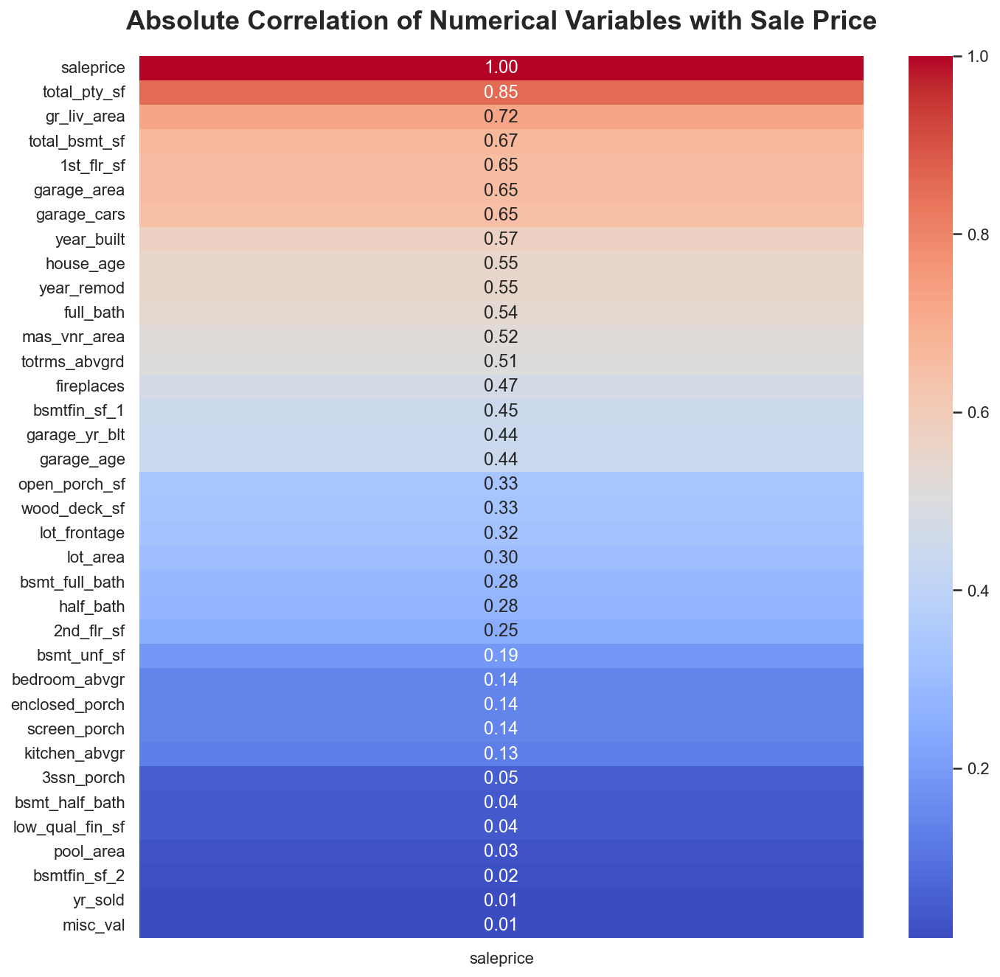

In [37]:
# Sort absolute correlation of numerical variables relative to 'saleprice' in decreasing order
abs_corr = pd.DataFrame(correlation.abs().sort_values(ascending = False))

# Plot heatmap of absolute correlation of numerical variables relative to 'saleprice' in decreasing order
sns.set(rc = {'figure.figsize':(11, 11)})
plot_corr = sns.heatmap(abs_corr, annot = True, fmt = '.2f', cmap = 'coolwarm')
plot_corr.set_title('Absolute Correlation of Numerical Variables with Sale Price', 
                    y = 1.02, fontsize = 18 , fontweight = 'bold')

In [38]:
# List numerical variables having correlation stronger than | 0.2 | with respect to 'saleprice' in decreasing order
hi_abs_corr = abs_corr.loc[(abs_corr['saleprice'] > 0.20) | (abs_corr['saleprice'] < -0.20), :]
print(hi_abs_corr)               # List these numerical variables and corresponding absolute correlation
print('\n')
print(hi_abs_corr.index)         # List these numerical variables
print('\n')
print(len(hi_abs_corr.index))    # Count number of numerical variables

                saleprice
saleprice            1.00
total_pty_sf         0.85
gr_liv_area          0.72
total_bsmt_sf        0.67
1st_flr_sf           0.65
garage_area          0.65
garage_cars          0.65
year_built           0.57
house_age            0.55
year_remod           0.55
full_bath            0.54
mas_vnr_area         0.52
totrms_abvgrd        0.51
fireplaces           0.47
bsmtfin_sf_1         0.45
garage_yr_blt        0.44
garage_age           0.44
open_porch_sf        0.33
wood_deck_sf         0.33
lot_frontage         0.32
lot_area             0.30
bsmt_full_bath       0.28
half_bath            0.28
2nd_flr_sf           0.25


Index(['saleprice', 'total_pty_sf', 'gr_liv_area', 'total_bsmt_sf',
       '1st_flr_sf', 'garage_area', 'garage_cars', 'year_built', 'house_age',
       'year_remod', 'full_bath', 'mas_vnr_area', 'totrms_abvgrd',
       'fireplaces', 'bsmtfin_sf_1', 'garage_yr_blt', 'garage_age',
       'open_porch_sf', 'wood_deck_sf', 'lot_frontage', 'lot_area',

In [39]:
# Drop these 12 numerical variables having correlation weaker than | 0.2 | with respect to 'saleprice'
train = train.drop(columns = ['bsmt_unf_sf', 'bedroom_abvgr', 'screen_porch', '3ssn_porch', 
                              'pool_area', 'bsmtfin_sf_2', 'misc_val', 'yr_sold', 
                              'low_qual_fin_sf', 'bsmt_half_bath', 'kitchen_abvgr', 'enclosed_porch'])
train.shape

(2029, 67)

**INTEPRETATIONS**:
- Low correlation of a feature with `'saleprice'` implies minimal impact on `'saleprice'`.
- Permanently drop these **12** numerical variables since each of these column's correlation with `'saleprice'` is low (i.e between -0.2 and 0.2):

 - `'bsmt_unf_sf'`
 - `'bedroom_abvgr'`
 - `'screen_porch'`
 - `'3ssn_porch'`
 - `'pool_area'`
 - `'bsmtfin_sf_2'`
 - `'misc_val'`
 - `'yr_sold'`
 - `'low_qual_fin_sf'`
 - `'bsmt_half_bath'`
 - `'kitchen_abvgr'`
 - `'enclosed_porch'`

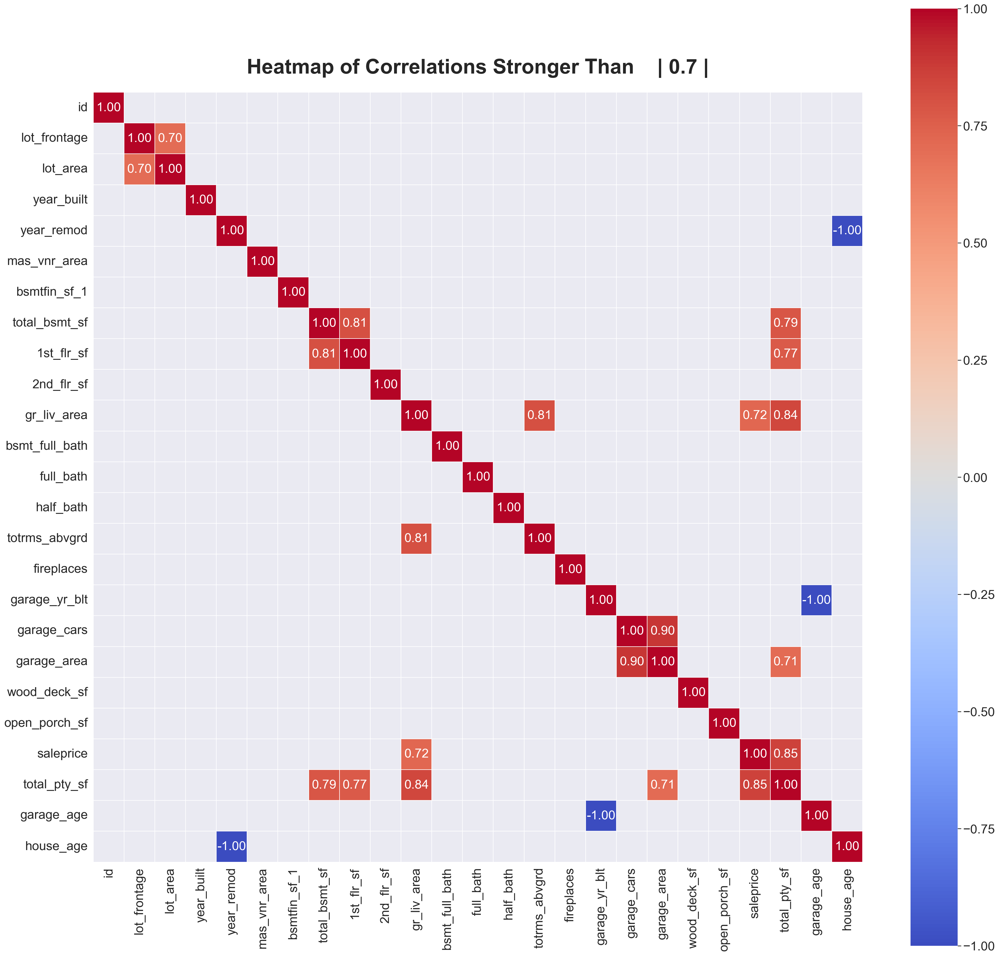

In [40]:
# Display heatmap, masking all correlations less than 0.7 in magnitude
lo_corr = train.corr()
mask_lo_corr = lo_corr[(lo_corr > 0.7) | (lo_corr < -0.7) ]

fig, axes = plt.subplots(nrows = 1, ncols = 1, figsize = (30, 30))
fig = sns.heatmap(mask_lo_corr, vmin = -1, vmax = 1, fmt = '.2f', 
                  cmap = 'coolwarm', linewidth = 1, linecolor = 'w', 
                  square = True, annot = True, annot_kws = {'size': 22})
fig.set_title('Heatmap of Correlations Stronger Than    | 0.7 |', 
              y = 1.02, fontsize = 36, fontweight = 'bold')
axes.tick_params(axis = 'both', which = 'major', labelsize = 22)
axes.collections[0].colorbar.ax.tick_params(labelsize = 22)

**INTEPRETATIONS**:
- The above heatmap reveals the correlation between 2 variables.
- Correlation coefficients (number in each square) indicate the strength of the linear relationship between 2 variables.
 - A linear correlation coefficient greater than zero indicates a positive relationship.
 - A value less than zero signifies a negative relationship.
 - A value of zero indicates no relationship between these 2 variables. 
- Correlation of a variable to itself will always be 1, as reflected by the red diagonal of '1's running from top left to bottom right.
- When 2 explanatory variables exhibit a linear association between themselves, they are collinear.

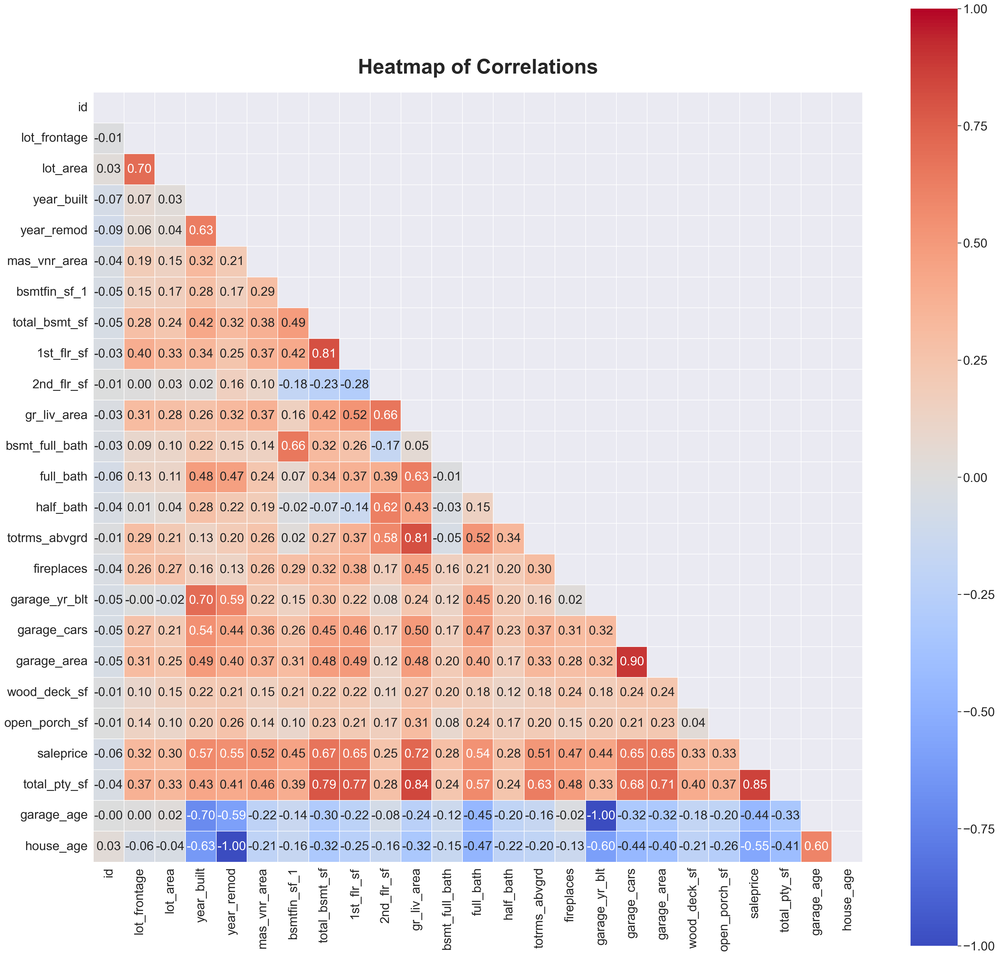

In [41]:
# Display heatmap
fig, axes = plt.subplots(nrows = 1, ncols = 1, figsize = (30, 30))
mask = np.triu(np.ones_like(train.corr(), dtype = bool))
fig = sns.heatmap(train.corr(), vmin = -1, vmax = 1, fmt = '.2f', mask = mask, 
                  cmap = 'coolwarm', linewidth = 1, linecolor = 'w', 
                  square = True, annot = True, annot_kws = {'size': 22})
fig.set_title('Heatmap of Correlations', y = 1.02, fontsize = 36, fontweight = 'bold')
axes.tick_params(axis = 'both', which = 'major', labelsize = 22)
axes.collections[0].colorbar.ax.tick_params(labelsize = 22)

In [42]:
# Permanently drop these columns due to high collinearity
# '1st_flr_sf', 'lot_area', 'garage_area', 'gr_liv_area', 
# 'total_bsmt_sf', 'garage_yr_blt', 'year_built', 'year_remod'
# 
# 'lot_area', 'lot_frontage' = 0.7025
#
# 'garage_area', 'garage_cars' = 0.8969
# 'garage_area', 'total_pty_sf' = 0.7087
# 
# 'year_built', 'garage_yr_blt' = 0.6966
# 'year_built', 'garage_age' = -0.6958
# 'garage_yr_blt', 'garage_age' = -0.9986
# 'year_remod', 'house_age' = -0.9981
# 
# 'gr_liv_area', 'total_pty_sf' = 0.8425
# 'gr_liv_area', 'totrms_abvgrd' = 0.8115
# 
# 'total_bsmt_sf', '1st_flr_sf' = 0.8083
# 'total_pty_sf', 'total_bsmt_sf' = 0.7873
# 'total_pty_sf', '1st_flr_sf' = 0.7668

print("Correlation of selected variables with 'saleprice':")
print("• 'total_pty_sf': " + str(round(train['total_pty_sf'].corr(train['saleprice']), 4)))
print("• 'gr_liv_area': " + str(round(train['gr_liv_area'].corr(train['saleprice']), 4)))
print("• 'total_bsmt_sf': " + str(round(train['total_bsmt_sf'].corr(train['saleprice']), 4)))
print("• '1st_flr_sf': " + str(round(train['1st_flr_sf'].corr(train['saleprice']), 4)))
print("• 'garage_area': " + str(round(train['garage_area'].corr(train['saleprice']), 4)))
print("• 'garage_cars': " + str(round(train['garage_cars'].corr(train['saleprice']), 4)))
print("• 'year_built': " + str(round(train['year_built'].corr(train['saleprice']), 4)))
print("• 'year_remod': " + str(round(train['year_remod'].corr(train['saleprice']), 4)))
print("• 'totrms_abvgrd': " + str(round(train['totrms_abvgrd'].corr(train['saleprice']), 4)))
print("• 'garage_yr_blt': " + str(round(train['garage_yr_blt'].corr(train['saleprice']), 4)))
print("• 'lot_frontage': " + str(round(train['lot_frontage'].corr(train['saleprice']), 4)))
print("• 'lot_area': " + str(round(train['lot_area'].corr(train['saleprice']), 4)))
print("• 'garage_age': " + str(round(train['garage_age'].corr(train['saleprice']), 4)))
print("• 'house_age': " + str(round(train['house_age'].corr(train['saleprice']), 4)))

train = train.drop(['1st_flr_sf', 'lot_area', 'garage_area', 'gr_liv_area', 
                    'total_bsmt_sf', 'garage_yr_blt', 'year_built', 'year_remod'], axis = 1)
train.shape

Correlation of selected variables with 'saleprice':
• 'total_pty_sf': 0.8541
• 'gr_liv_area': 0.7218
• 'total_bsmt_sf': 0.6685
• '1st_flr_sf': 0.6548
• 'garage_area': 0.654
• 'garage_cars': 0.6475
• 'year_built': 0.5713
• 'year_remod': 0.5489
• 'totrms_abvgrd': 0.5103
• 'garage_yr_blt': 0.4416
• 'lot_frontage': 0.3214
• 'lot_area': 0.3027
• 'garage_age': -0.4416
• 'house_age': -0.5501


(2029, 59)

Permanently drop these columns due to:

- **`'lot_area'`**: 'lot_area' has high collinearity with 'lot_frontage' (0.7025). 'lot_area' (0.3027) has lower correlation with 'saleprice' than 'lot_frontage' (0.3214).
- **`'garage_area'`**: 'garage_area' has high collinearity with 'garage_cars' (0.8969) and 'total_pty_sf' (0.7087). 'garage_area' (0.6540) has lower correlation with 'saleprice' than 'total_pty_sf' (0.8541), and comparable to 'garage_cars' (0.6475) in terms of correlation with 'saleprice'.
- **`'gr_liv_area'`**: 'gr_liv_area' has high collinearity with 'totrms_abvgrd' (0.8115) and 'total_pty_sf' (0.8425). 'gr_liv_area' (0.7218) has lower correlation with 'saleprice' than 'total_pty_sf' (0.8541).
- **`'total_bsmt_sf'`** and **`'1st_flr_sf'`**: 'total_bsmt_sf' has high collinearity with both '1st_flr_sf' (0.8083) and 'total_pty_sf' (0.7873). '1st_flr_sf' has high collinearity with 'total_pty_sf' (0.7668) too. Both 'total_bsmt_sf' (0.6685) and '1st_flr_sf' (0.6548) have lower correlation with 'saleprice' than 'total_pty_sf' (0.8541).
- **`'garage_yr_blt'`**, **`'year_built'`**, and **`'year_remod'`**: Both newly created 'house_age' and 'garage_age' features provide more meaningful information.

> Given that features such as `'total_pty_sf'` and `'garage_cars'` have relative high correlation of **at least 0.60** with `'saleprice'`, we could potentially derive at a model that could predict housing prices at Ames, Iowa. 

In [43]:
# Retrieve final list of numerical variables
train_num = get_num_var(train)
print(len(train_num))

17


After data cleaning, feature engineering, and EDA of the numerical variables, we have **59** columns remaining in the Train dataset, comprising:
 - **17** numerical variables (including `'id'` and `'saleprice'`) and 
 - **42** categorical variables.

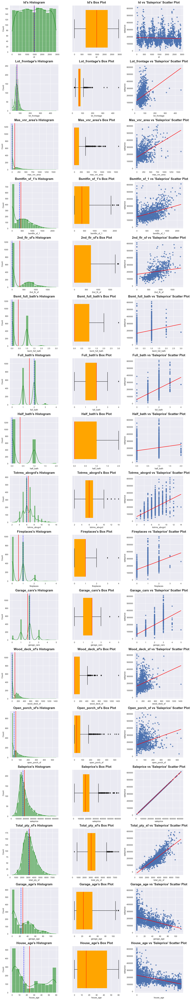

In [44]:
# Display Count Plot, Box Plot and Plot of numerical features vs 'saleprice'
plot_num(train, train_num)

**INTEPRETATIONS**:
- Many features have a positively- or right-skewed distribution (i.e. long right tail), such as `'lot_frontage'`, `'mas_vnr_area'`, `'bsmtfin_sf_1'`, `'wood_deck_sf'`, `'open_porch_sf'`, and `'garage_age'`. The box plots for these features in the middle column also tend to compress to the left, reflecting similar distribution, with numerous dots on the right indicating the outliers.
- The blue dashed and red solid lines on the left column represent the mean and median of the graphs respectively. When the mean is to the left of the median, there are generally many more small values and potential outliers on the opposite side, e.g. `'mas_vnr_area'`. 
- An upward sloping red line on the right column implies a positive correlation between the feature and `'saleprice'`, e.g. `'total_pty_sf'`, indicating buyers' willingness to pay a premium for a generally bigger house with higher total property area in square feet.
- A downward sloping red line on the right column implies a negative correlation between the feature and `'saleprice'`, e.g. `'garage_age'`, indicating buyers' willingness to pay a premium for a house with a newer garage.
- A nearly flat red line on the right column implies nearly no correlation between the feature and `'saleprice'`, e.g. `'id'`, indicating the order's observation number has virtually no bearing on the house's sale price.

## Exploratory Data Analysis (EDA): Categorical Variables
---

In [45]:
# Retrieve list of categorical variables
train_cat = get_cat_var(train)
len(train_cat)

42

In [46]:
# Display Count Plot and Box Plot of nominal feature vs 'saleprice'
plot_cat(train, train_cat)

**INTEPRETATIONS**:
- Blue vertical line on the left column represents **~ 1624** or **> 80%** of **total count 2029**.
- When **1** category within a feature is **greater than 80%** of **total count**, that category generally has the greatest impact on sale price.
- Permanently drop these **19** columns since each of the column has a category that dominates the count plot (i.e **> 1624** or **> 80%** of **total count 2029**):
    - `'bldg_type'`
    - `'bsmt_cond'`
    - `'bsmtfin_type_2'`
    - `'central_air'`
    - `'condition_1'`
    - `'condition_2'`
    - `'electrical'`
    - `'exter_cond'`
    - `'functional'`
    - `'garage_cond'`
    - `'garage_qual'`
    - `'heating'`
    - `'land_contour'`
    - `'land_slope'`
    - `'paved_drive'`
    - `'roof_matl'`
    - `'sale_type'`
    - `'street'`
    - `'utilities'`

In [47]:
# Permanently drop the following 19 columns:
# 'bldg_type', 'bsmt_cond', 'bsmtfin_type_2', 'central_air', 'condition_1', 'condition_2', 'electrical', 
# 'exter_cond', 'functional', 'garage_cond', 'garage_qual', 'heating', 'land_contour', 'land_slope', 
# 'paved_drive', 'roof_matl', 'sale_type', 'street', 'utilities'
train = train.drop(['street', 'land_contour', 'utilities', 'land_slope', 'condition_1', 'condition_2', 
                    'bldg_type', 'roof_matl', 'exter_cond', 'bsmt_cond', 'bsmtfin_type_2', 'heating', 
                    'central_air', 'electrical', 'functional', 'garage_qual', 'garage_cond', 'paved_drive', 
                    'sale_type'], axis = 1)
train.shape

(2029, 40)

### Preprocess ordinal categorical variables — Integer Encoding

In [48]:
# Impute these 11 ordinal categorical columns with the corresponding mapping
# 'lot_shape', 'overall_qual', 'overall_cond', 'exter_qual', 'bsmt_qual', 'bsmt_exposure', 
# 'bsmtfin_type_1', 'heating_qc', 'kitchen_qual', 'fireplace_qu', 'garage_finish'
# (Smaller number = Worse ; Larger number = Better)

# 'NaN': 0
# Po (Poor): 1
# Fa (Fair): 2
# TA (Typical/Average): 3
# Gd (Good): 4
# Ex (Excellent): 5

train = train.replace({'bsmt_qual' : {'NaN' : 0, 'Po' : 1, 'Fa' : 2, 'TA' : 3, 'Gd' : 4, 'Ex' : 5}, 
                       'exter_qual' : {'Po' : 1, 'Fa' : 2, 'TA' : 3, 'Gd' : 4, 'Ex' : 5}, 
                       'fireplace_qu' : {'NaN' : 0, 'Po' : 1, 'Fa' : 2, 'TA' : 3, 'Gd' : 4, 'Ex' : 5}, 
                       'heating_qc' : {'Po' : 1, 'Fa' : 2, 'TA' : 3, 'Gd' : 4, 'Ex' : 5}, 
                       'kitchen_qual' : {'NaN' : 0, 'Po' : 1, 'Fa' : 2, 'TA' : 3, 'Gd' : 4, 'Ex' : 5}})

# Very Poor: 1
# Poor: 2
# Fair: 3
# Below Average: 4 
# Average: 5
# Above Average: 6
# Good: 7
# Very Good: 8
# Excellent: 9
# Very Excellent: 10

# Change datatype for 2 columns 'overall_qual' and 'overall_cond' to integer instead
train = train.astype({'overall_qual': int, 'overall_cond': int}, errors = 'raise')

# IR3 (Irregular): 0
# IR2 (Moderately Irregular): 1
# IR1 (Slightly irregular): 2
# Reg (Regular): 3

train = train.replace({'lot_shape' : {'IR3' : 0, 'IR2' : 1, 'IR1' : 2, 'Reg' : 3}})

# ELO (Electricity only): 0
# NoSeWa (Electricity & Gas Only): 1
# NoSewr (Electricity, Gas, & Water (Septic Tank)): 2
# AllPub (All public Utilities (E,G,W,& S)): 3

train = train.replace({'bsmt_exposure' : {'NaN' : 0, 'No' : 1, 'Mn' : 2, 'Av' : 3, 'Gd' : 4}})

# NA (No Basement): 0
# Unf (Unfinished): 1
# LwQ (Low Quality): 2
# Rec (Average Rec Room): 3
# BLQ (Below Average Living Quarters): 4
# ALQ (Average Living Quarters): 5
# GLQ (Good Living Quarters): 6

train = train.replace({'bsmtfin_type_1' : {'NaN' : 0, 'Unf' : 1, 'LwQ' : 2, 
                                           'Rec' : 3, 'BLQ' : 4, 'ALQ' : 5, 'GLQ' : 6}})

# Mix (Mixed): 0
# FuseP (Poor): 1
# FuseF (Fair): 2
# FuseA (Average): 3
# SBrkr (Standard Circuit Breakers): 4

train = train.replace({'garage_finish' : {'NaN' : 0, 'Unf' : 1, 'RFn' : 2, 'Fin' : 3}})

# N (Dirt/Gravel): 0
# P (Partial Pavement): 1
# Y (Paved): 2

### Correlation Analysis (II)

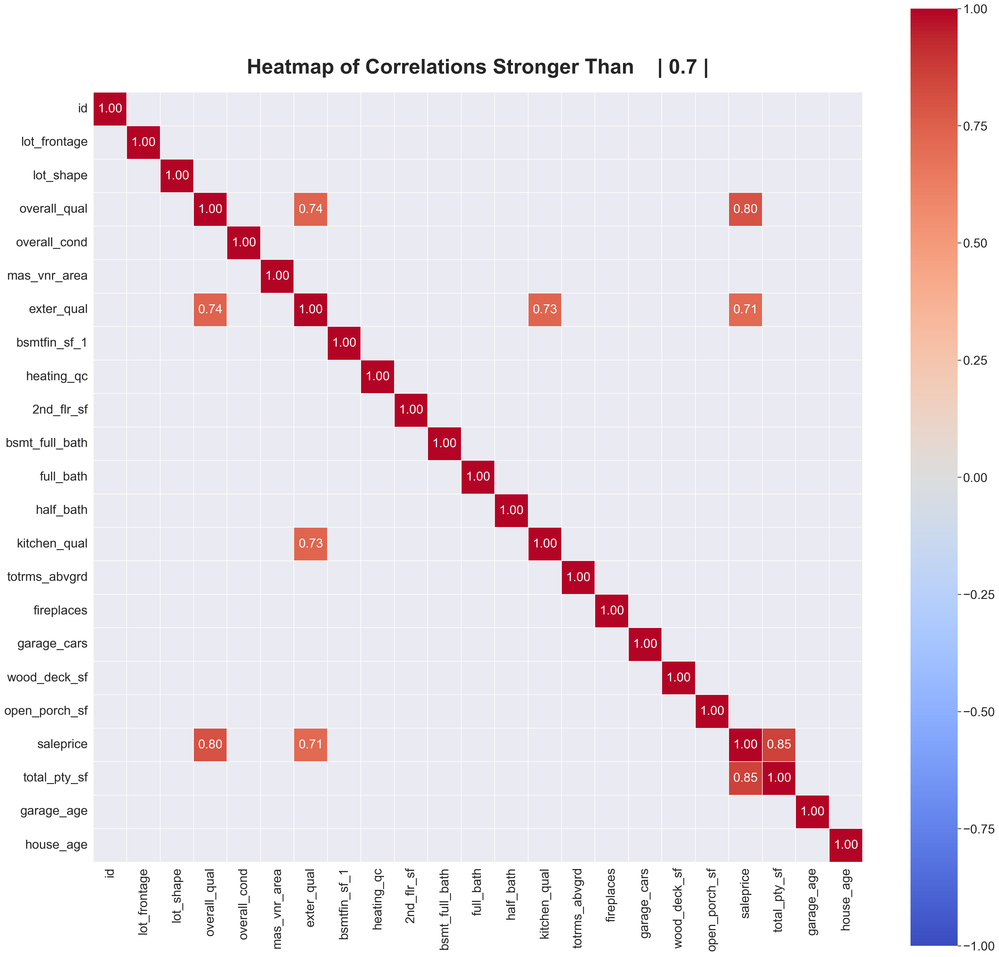

In [49]:
# Display heatmap, masking all correlations less than 0.7 in magnitude
lo_corr = train.corr()
mask_lo_corr = lo_corr[(lo_corr > 0.7) | (lo_corr < -0.7) ]

fig, axes = plt.subplots(nrows = 1, ncols = 1, figsize = (30, 30))
fig = sns.heatmap(mask_lo_corr, vmin = -1, vmax = 1, fmt = '.2f', 
                  cmap = 'coolwarm', linewidth = 1, linecolor = 'w', 
                  square = True, annot = True, annot_kws = {'size': 22})
fig.set_title('Heatmap of Correlations Stronger Than    | 0.7 |', 
              y = 1.02, fontsize = 36, fontweight = 'bold')
axes.tick_params(axis = 'both', which = 'major', labelsize = 22)
axes.collections[0].colorbar.ax.tick_params(labelsize = 22)

> Given that several features such as **`'overall_qual'`** (0.8033), **`'exter_qual'`** (0.7143), and **`'total_pty_sf'`** (0.8541) have relative high correlation of **at least 0.71** with **`'saleprice'`**, we could potentially derive at a model that could predict housing prices at Ames, Iowa.

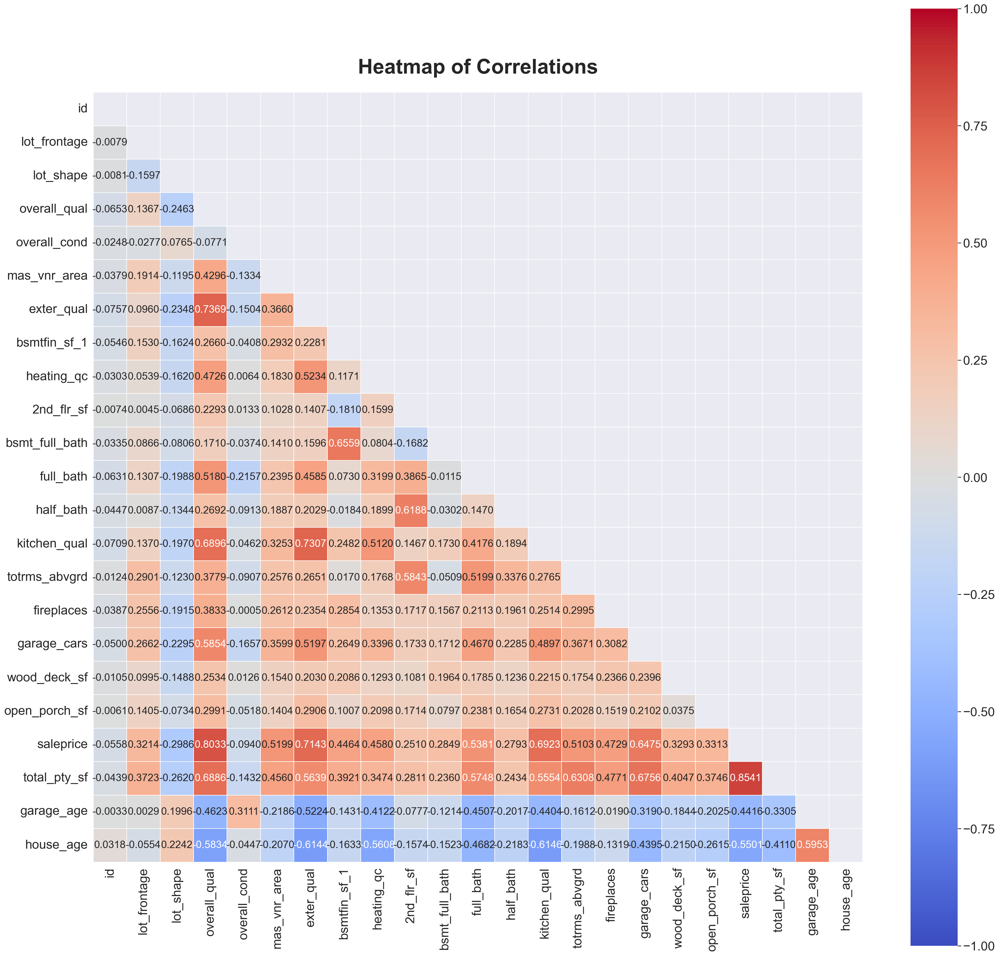

In [50]:
# Display heatmap
fig, axes = plt.subplots(nrows = 1, ncols = 1, figsize = (30, 30))
mask = np.triu(np.ones_like(train.corr(), dtype = bool))
fig = sns.heatmap(train.corr(), vmin = -1, vmax = 1, fmt = '.4f', mask = mask, 
                  cmap = 'coolwarm', linewidth = 1, linecolor = 'w', 
                  square = True, annot = True, annot_kws = {'size': 18})
fig.set_title('Heatmap of Correlations', y = 1.02, fontsize = 36, fontweight = 'bold')
axes.tick_params(axis = 'both', which = 'major', labelsize = 22)
axes.collections[0].colorbar.ax.tick_params(labelsize = 22)

In [51]:
# Permanently drop 'exter_qual' column due to high collinearity
# 
# 'exter_qual', 'overall_qual' = 0.7369
# 'exter_qual', 'kitchen_qual' = 0.7307
# 
print("Correlation of selected variables with 'saleprice':")
print("• 'exter_qual': " + str(round(train['exter_qual'].corr(train['saleprice']), 4)))
print("• 'kitchen_qual': " + str(round(train['kitchen_qual'].corr(train['saleprice']), 4)))
print("• 'overall_qual': " + str(round(train['overall_qual'].corr(train['saleprice']), 4)))

# Permanently drop both 'exter_qual' and 'overall_cond' columns due to low correlation with 'saleprice'
train = train.drop(['exter_qual', 'overall_cond'], axis = 1)
train.shape

Correlation of selected variables with 'saleprice':
• 'exter_qual': 0.7143
• 'kitchen_qual': 0.6923
• 'overall_qual': 0.8033


(2029, 38)

Permanently drop these 2 columns due to:

- **`'exter_qual'`**: 'exter_qual' has high collinearity with both 'kitchen_qual' (0.7307) and 'overall_qual' (0.7369) while also having high correlation with 'saleprice' (0.7143). Since 'saleprice' is relatively highly correlated to both 'overall_qual' (0.8033) and 'kitchen_qual' (0.6923), 'exter_qual' is dropped.
- **`'overall_cond'`**: Since 'overall_cond' has low correlation (-0.0940) with 'saleprice', 'overall_cond' is dropped too.

After data cleaning, feature engineering, and EDA of both categorical and numerical variables, we have **38** columns remaining in the Train dataset, comprising:
 - **17** numerical variables (including `'id'` and `'saleprice'`) and 
 - **21** categorical variables.

### Preprocess nominal categorical variables — Dummy Variable Encoding

For nominal categorical variables, we need to translate them into numbers before fitting to a model. This can be done using **Dummy Variable Encoding**, whereby 
- each category of a nominal categorical variable is replaced by a new binary/dummy variable, and 
- each new binary/dummy variable takes on the value "**1**" for the category it represents and "**0**"s for all other categories belonging to the same nominal categorical variable.
- C categories are represented by C-1 binary/dummy variables
  - Eg. When encoding 3 colours red, green, and **blue**, we could encode as [0, 1], [1, 0] and **[0, 0]** respectively where **blue** will become the **"first" category** or **baseline** and be assigned **[0, 0]**.
  - This could be implemented using [**pandas.get_dummies**](https://pandas.pydata.org/docs/reference/api/pandas.get_dummies.html) with the **_drop_first = True_** parameter.

In [52]:
# Convert each categorical columns into a one-hot encoded matrix
train_dum = pd.get_dummies(train, drop_first = True)

In [53]:
train.shape

(2029, 38)

In [54]:
train_dum.shape

(2029, 161)

In [55]:
train_dum.dtypes

id                        int64
lot_frontage            float64
lot_shape                 int64
overall_qual              int32
mas_vnr_area            float64
bsmtfin_sf_1            float64
heating_qc                int64
2nd_flr_sf                int64
bsmt_full_bath          float64
full_bath                 int64
half_bath                 int64
kitchen_qual              int64
totrms_abvgrd             int64
fireplaces                int64
garage_cars             float64
wood_deck_sf              int64
open_porch_sf             int64
saleprice                 int64
total_pty_sf            float64
garage_age              float64
house_age                 int64
ms_subclass_150           uint8
ms_subclass_160           uint8
ms_subclass_180           uint8
ms_subclass_190           uint8
ms_subclass_20            uint8
ms_subclass_30            uint8
ms_subclass_40            uint8
ms_subclass_45            uint8
ms_subclass_50            uint8
ms_subclass_60            uint8
ms_subcl

### Summary:
- We started with 'Train.csv' containing 2051 rows and 81 variables.
- 'Train.csv' dataset was analysed during data cleaning to remove duplicates, outliers, impute missing and null cells with appropriate values, with potentially irrelevant and/or collinear variables removed.  
- Subsequent to data cleaning and Exploratory Data Analysis (EDA) but prior to getting dummies on the remaining categorical variables, we were left with 2029 rows and 38 variables.
- After getting dummies on these remaining categorical variables, we were left with 2029 rows and 161 variables.
- As higlighted above, given that several features such as **`'overall_qual'`** (0.8033), **`'exter_qual'`** (0.7143), and **`'total_pty_sf'`** (0.8541) have relative high correlation of **at least 0.71** with **`'saleprice'`**, we could potentially derive at a model that could predict housing prices at Ames, Iowa.

## Model Preparation
---

In [56]:
# For each column, load in only if it is numeric and not 'saleprice'
features = [col for col in train_dum._get_numeric_data().columns if col != 'saleprice']
X = train_dum[features]
y = train_dum['saleprice']

### Train-Test Split Evaluation

Train-Test Split Evaluation is done to fit the data preparation on the training set, then apply the transform to the train and test sets.

This requires us to perform the required steps in the following specific sequence:
 - split the data into train and test sets
 - apply the StandardScaler
 - call the fit() function on the training set
 - apply the transform() function on the train and test sets to create a normalized version of each dataset.

This avoids data leakage as the calculation of the minimum and maximum value for each input variable is done using only the training dataset (X_train) instead of the entire dataset (X).

[Data leakage](https://machinelearningmastery.com/data-leakage-machine-learning/) refers to a problem where information about the holdout dataset, such as a test or validation dataset, is made available to the model in the training dataset. This leakage is often small and subtle but can have a marked effect on performance.

In [57]:
# Use the 'train_test_split' function to split our `X` and `y` variables into a training set and a holdout set.
X_train, X_val, y_train, y_val = train_test_split(X, y, random_state = 42)

### Standard Scaling variables

[Dataset standardization](https://machinelearningmastery.com/standardscaler-and-minmaxscaler-transforms-in-python/) rescales the distribution of values so that the mean of observed values is 0 and the standard deviation is 1. This method is sometimes called 'center scaling' because the mean is subtracted from each data value ('centering') and the result is divided by the standard deviation ('scaling') .

Standardization assumes that the observations fit a Gaussian/Normal distribution (bell curve) with a well-behaved mean and standard deviation. Since the Train dataset (n = 2029) or sample size is sufficiently large (usually n > 30), the [Central Limit Theorem](https://sphweb.bumc.bu.edu/otlt/mph-modules/bs/bs704_probability/BS704_Probability12.html) applies and the distribution of the sample means will be approximately normally distributed regardless of whether the source population is normal or skewed.

The statistics required for the transformation (e.g., the mean) are estimated from the training set and are applied to all data sets (e.g., the test set or new samples).

In [58]:
# Use the "fit_transform" function to standardize the X design matrix
ss = StandardScaler()
ss.fit(X_train)
X_train = ss.transform(X_train)
X_val = ss.transform(X_val)

# Standardization is necessary for regularized regression because the beta values for each predictor variable 
# must be on the same scale. If betas are of different sizes just because of the scale of predictor variables, 
# the regularization term can't determine which betas are more/less important based on their size.

## Modeling
---

We will train our Train dataset on the following 3 models:
 - [Ordinary Least Squares (OLS) Model [`Baseline Model`]](#Ordinary-Least-Squares-(OLS)-Model-[Baseline-Model])
 - [Lasso Regression Model](#Lasso-Regression-Model)
 - [Ridge Regression Model](#Ridge-Regression-Model)

### Ordinary Least Squares (OLS) Model [`Baseline Model`]

The Ordinary Least Squares (OLS) Model shall be our Baseline Model.

In [59]:
# Instantiate OLS Model
lr = LinearRegression()

#### OLS Model Training

In [60]:
# Fit OLS Model on train dataset
lr.fit(X_train, y_train)

LinearRegression()

In [61]:
# Calculate OLS Model's R² train score
lr_train_predict = lr.predict(X_train)
lr_train_r2 = round(metrics.r2_score(y_train, lr_train_predict), 6)
print('OLS Train R² ≈', lr_train_r2)

OLS Train R² ≈ 0.923385


In [62]:
# OLS Model 10-folds Cross Validation Score
lr_score = cross_val_score(lr, X_train, y_train, scoring = 'neg_mean_squared_error', cv = 10).mean()
lr_train_rmse = round(np.sqrt(-1 * lr_score), 6)
print('OLS Train RMSE ≈', lr_train_rmse)

OLS Train RMSE ≈ 2.0678915042233572e+16


According to the [scikit-learn documentation](https://scikit-learn.org/stable/modules/model_evaluation.html#scoring-parameter), **all** scorer objects follow the convention that **higher return values are better than lower return values**.  Thus metrics which measure the distance between the model and the data, like `metrics.mean_squared_error`, are available as **`neg_mean_squared_error`** where the cross_val_score() function returns the negated value of this metric.

This is because evaluation metrics such as `mean squared error` are naturally descending scores (the smallest score is best). While the scores are reported as negative, by definition, they can never be negative.

#### OLS Model Validation

In [63]:
# Predict 'saleprice' on validation data
lr_predict = lr.predict(X_val)

In [64]:
# Calculate OLS Model's R² validation score
lr_val_r2 = round(metrics.r2_score(y_val, lr_predict), 6)
print('OLS Validation R² ≈', lr_val_r2)

OLS Validation R² ≈ -6.3538659286791995e+22


In [65]:
# OLS Model Validation Score
lr_val_rmse = round(np.sqrt(metrics.mean_squared_error(lr_predict, y_val)), 6)
print('OLS Validation RMSE ≈', lr_val_rmse)

OLS Validation RMSE ≈ 1.9293147035034548e+16


**INTEPRETATIONS**:
- Since RMSE indicates the average deviation between a model's predictions and the actual values, the huge RMSE score indicates that the OLS model is terrible at predicting the house prices. This is possibly due to potential multi-collinearity issues arising from the preceding 'get dummies' process step.
- OLS model's validation R² yielded a highly negative value. This can arise, for instance, when linear regression is conducted without including an intercept,**[_5_]** or when a non-linear function is used to fit the data.**[_6_]**
- In cases where negative R² values arise, the mean of the data provides a better fit to the outcomes than do the fitted OLS function values.

  **[_5_]** Barten, Anton P. (1987). "The Coeffecient of Determination for Regression without a Constant Term". In Heijmans, Risto; Neudecker, Heinz (eds.). The Practice of Econometrics. Dordrecht: Kluwer. pp. 181–189. ISBN [90-247-3502-5](https://link.springer.com/book/10.1007/978-94-009-3591-4).<br>
  **[_6_]** Colin Cameron, A.; Windmeijer, Frank A.G. (1997). "An R-squared measure of goodness of fit for some common nonlinear regression models". Journal of Econometrics. 77 (2): 1790–2. doi:[10.1016/S0304-4076(96)01818-0](https://www.sciencedirect.com/science/article/abs/pii/S0304407696018180).

### Lasso Regression Model

#### Find optimal Lasso Regression alpha

In [66]:
# Find optimal value for Lasso Regression alpha using LassoCV
optimal_lasso = LassoCV(n_alphas = 500, cv = 10, verbose = 1)

In [67]:
# Fit on train dataset to retrieve optimal alpha
optimal_lasso.fit(X_train, y_train)

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
.......................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................

LassoCV(cv=10, n_alphas=500, verbose=1)

In [68]:
print(optimal_lasso.alpha_)

192.96657456136444


#### Lasso Regression Model Training

In [69]:
# Instantiate Lasso Regression Model, using the optimal alpha
lasso = Lasso(alpha = optimal_lasso.alpha_)

In [70]:
# Fit Lasso Regression Model with optimal alpha on train dataset
lasso.fit(X_train, y_train)

Lasso(alpha=192.96657456136444)

In [71]:
# Calculate Lasso Regression Model's R² train score
lasso_train_predict = lasso.predict(X_train)
lasso_train_r2 = round(metrics.r2_score(y_train, lasso_train_predict), 6)
print('Lasso Train R² ≈', lasso_train_r2)

Lasso Train R² ≈ 0.919832


In [72]:
# Lasso Regression Model 10-folds Cross Validation Score
lasso_score = cross_val_score(lasso, X_train, y_train, scoring = 'neg_mean_squared_error', cv = 10).mean()
lasso_train_rmse = round(np.sqrt(-1 * lasso_score), 6)
print ('Lasso Train RMSE ≈', lasso_train_rmse)

Lasso Train RMSE ≈ 25449.849002


#### Lasso Regression Model Validation

In [73]:
# Predict 'saleprice' on validation data
lasso_predict = lasso.predict(X_val)

In [74]:
# Calculate Lasso Regression Model's R² validation score
lasso_val_r2 = round(metrics.r2_score(y_val, lasso_predict), 6)
print('Lasso Validation R² ≈', lasso_val_r2)

Lasso Validation R² ≈ 0.898834


In [75]:
# Lasso Regression Model Validation Score
lasso_val_rmse = round(np.sqrt(metrics.mean_squared_error(lasso_predict, y_val)), 6)
print('Lasso Validation RMSE ≈', lasso_val_rmse)

Lasso Validation RMSE ≈ 24344.481732


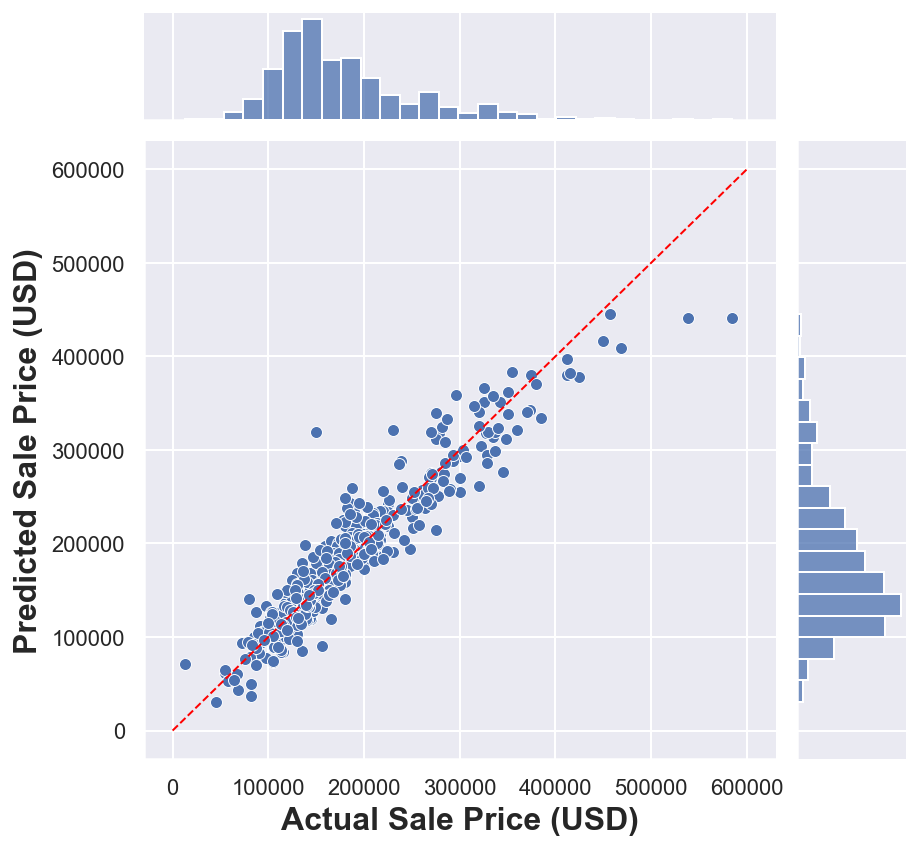

In [76]:
# Plot validation 'saleprice' vs predicted 'saleprice' from Lasso Regression Model
lasso_plot = sns.jointplot(x = y_val, y = lasso_predict)
lasso_plot.set_axis_labels('Actual Sale Price (USD)', 'Predicted Sale Price (USD)', 
                           fontsize = 16, fontweight = 'bold')

# Plot line of equality
lasso_plot.ax_joint.plot([0, 600000], [0, 600000], color = 'red', linewidth = 1, linestyle = 'dashed')

**INTEPRETATIONS**:
- In the ideal scenario, each predicted sale price perfectly matches each actual sale price, indicated by the red dotted 45° diagonal line which is also known as the [**identity line**](https://en.wikipedia.org/wiki/Identity_line) or **line of equality** where **y = x**.
- We can observe that the histograms for both actual and predicted sale prices have a positively- or right-skewed distribution (i.e. long right tail).
- Additionally, most of the points cluster close to both sides of this identity line for sale prices up to approximately USD 400,000, and starts deviating downwards away from the identity line for sale prices higher than USD 400,000.
- This means that the Lasso Regression Model is better able at predicting actual sales prices up to approximately USD400,000, and starts to underestimate the actual sales prices above USD 400,000.

### Ridge Regression Model

#### Find optimal Ridge Regression alpha

In [77]:
# Set range to search for optimal alpha
ridge_alphas = np.logspace(0, 5, 200)

# Find optimal value for Ridge Regression alpha using RidgeCV
optimal_ridge = RidgeCV(alphas = ridge_alphas, cv = 10)

In [78]:
# Fit on train dataset to retrieve optimal alpha
optimal_ridge.fit(X_train, y_train)

RidgeCV(alphas=array([1.00000000e+00, 1.05956018e+00, 1.12266777e+00, 1.18953407e+00,
       1.26038293e+00, 1.33545156e+00, 1.41499130e+00, 1.49926843e+00,
       1.58856513e+00, 1.68318035e+00, 1.78343088e+00, 1.88965234e+00,
       2.00220037e+00, 2.12145178e+00, 2.24780583e+00, 2.38168555e+00,
       2.52353917e+00, 2.67384162e+00, 2.83309610e+00, 3.00183581e+00,
       3.18062569e+00, 3.37006433e+0...
       2.64308149e+04, 2.80050389e+04, 2.96730241e+04, 3.14403547e+04,
       3.33129479e+04, 3.52970730e+04, 3.73993730e+04, 3.96268864e+04,
       4.19870708e+04, 4.44878283e+04, 4.71375313e+04, 4.99450512e+04,
       5.29197874e+04, 5.60716994e+04, 5.94113398e+04, 6.29498899e+04,
       6.66991966e+04, 7.06718127e+04, 7.48810386e+04, 7.93409667e+04,
       8.40665289e+04, 8.90735464e+04, 9.43787828e+04, 1.00000000e+05]),
        cv=10)

In [79]:
print(optimal_ridge.alpha_)

12.033778407775898


#### Lasso Regression Model Training

In [80]:
# Instantiate Ridge Regression Model, using the optimal alpha
ridge = Ridge(alpha = optimal_ridge.alpha_)

In [81]:
# Fit Ridge Regression Model with optimal alpha on train dataset
ridge.fit(X_train, y_train)

Ridge(alpha=12.033778407775898)

In [82]:
# Calculate Ridge Regression Model's R² train score
ridge_train_predict = ridge.predict(X_train)
ridge_train_r2 = round(metrics.r2_score(y_train, ridge_train_predict), 6)
print('Ridge Train R² ≈', ridge_train_r2)

Ridge Train R² ≈ 0.922757


In [83]:
# Ridge Regression Model 10-folds Cross Validation Score
ridge_score = cross_val_score(ridge, X_train, y_train, scoring = 'neg_mean_squared_error', cv = 10).mean()
ridge_train_rmse = round(np.sqrt(-1 * ridge_score), 6)
print ('Ridge Train RMSE ≈', ridge_train_rmse)

Ridge Train RMSE ≈ 25596.681122


#### Lasso Regression Model Validation

In [84]:
# Predict 'saleprice' on validation data
ridge_predict = ridge.predict(X_val)

In [85]:
# Calculate Ridge Regression Model's R² validation score
ridge_val_r2 = round(metrics.r2_score(y_val, ridge_predict), 6)
print('Ridge Validation R² ≈', ridge_val_r2)

Ridge Validation R² ≈ 0.898019


In [86]:
# Ridge Regression Model Validation Score
ridge_val_rmse = round(np.sqrt(metrics.mean_squared_error(ridge_predict, y_val)), 6)
print('Ridge Validation RMSE ≈', ridge_val_rmse)

Ridge Validation RMSE ≈ 24442.337721


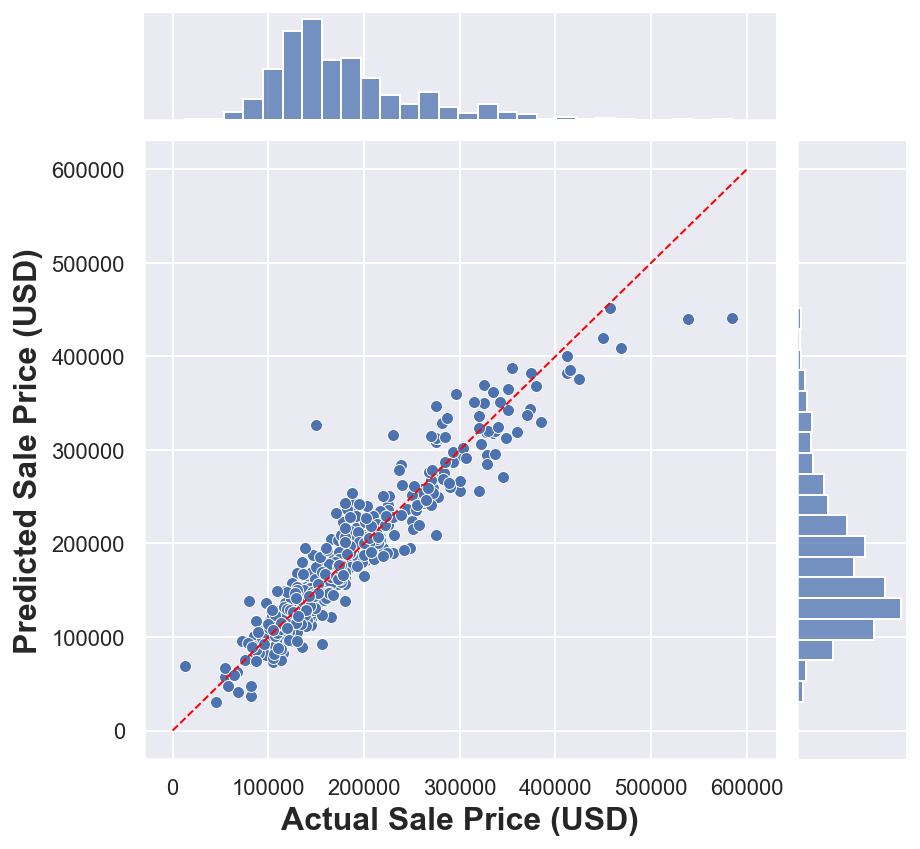

In [87]:
# Plot validation 'saleprice' vs predicted 'saleprice' from Ridge Regression Model
ridge_plot = sns.jointplot(x = y_val, y = ridge_predict)
ridge_plot.set_axis_labels('Actual Sale Price (USD)', 'Predicted Sale Price (USD)', 
                           fontsize = 16, fontweight = 'bold')

# Plot line of equality
ridge_plot.ax_joint.plot([0, 600000], [0, 600000], color = 'red', linewidth = 1, linestyle = 'dashed')

**INTEPRETATIONS**:
- Similar to the discussion for the Lasso Regression Model, in the ideal scenario, each predicted sale price perfectly matches each actual sale price, indicated by the red dotted 45° diagonal line which is also known as the [**identity line**](https://en.wikipedia.org/wiki/Identity_line) or **line of equality** where **y = x**.
- We can observe that the histograms for both actual and predicted sale prices have a positively- or right-skewed distribution (i.e. long right tail).
- Additionally, most of the points cluster close to both sides of this identity line for sale prices up to approximately USD 400,000, and starts deviating downwards away from the identity line for sale prices higher than USD 400,000.
- This means that the Ridge Regression Model is better able at predicting actual sales prices up to approximately USD400,000, and starts to underestimate the actual sales prices above USD 400,000.

### Residuals Analysis

In [88]:
# Calculate Residuals
lasso_residual = y_val - lasso_predict
ridge_residual = y_val - ridge_predict

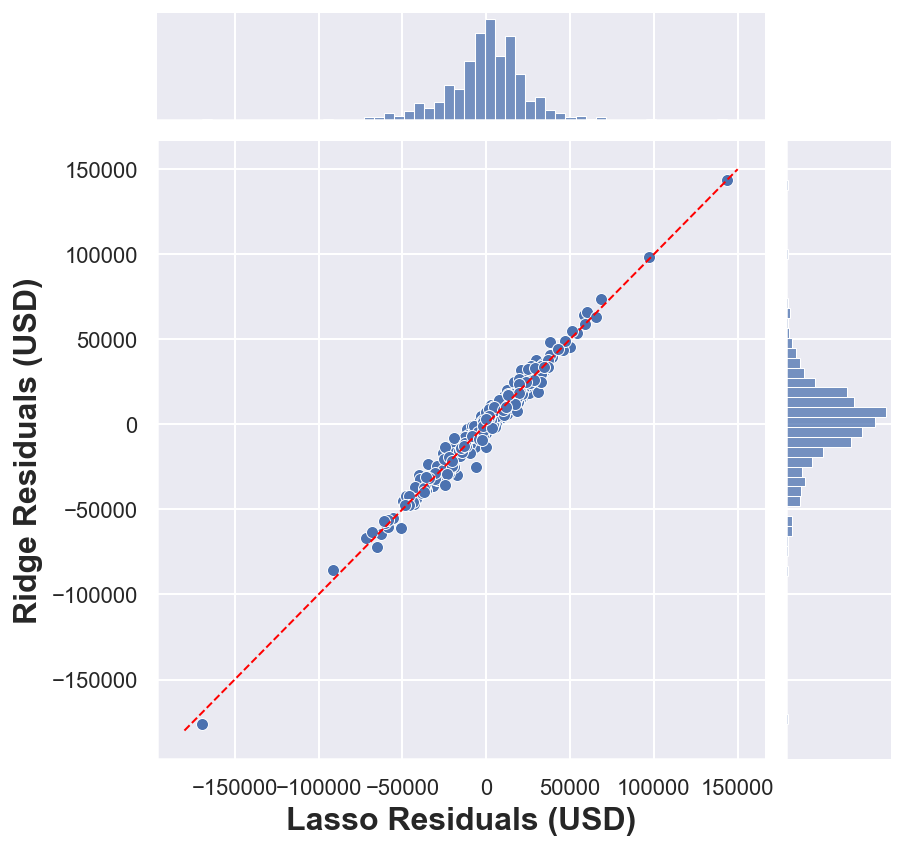

In [89]:
# Plot residuals of both plots
lasso_ridge_residual_plot = sns.jointplot(lasso_residual, ridge_residual)
lasso_ridge_residual_plot.set_axis_labels('Lasso Residuals (USD)', 'Ridge Residuals (USD)', 
                                          fontsize = 16, fontweight = 'bold')
# Plot line of equality
lasso_ridge_residual_plot.ax_joint.plot([-180000, 150000], [-180000, 150000], color = 'red', 
                                        linewidth = 1, linestyle = 'dashed')

**INTEPRETATIONS**:
- We can observe that the histograms for both Lasso Residuals and Ridge Residuals have distributions of approximately zero skewness, with most of the points concentrating around the origin (0,0).
- The red dotted 45° diagonal line is also known as the [**identity line**](https://en.wikipedia.org/wiki/Identity_line) or **line of equality** where **y = x**.
- Since most of the points cluster close to both sides of this identity line, both the Lasso and Ridge Regression Models are expected to be comparable in their ability to predict actual sales prices.

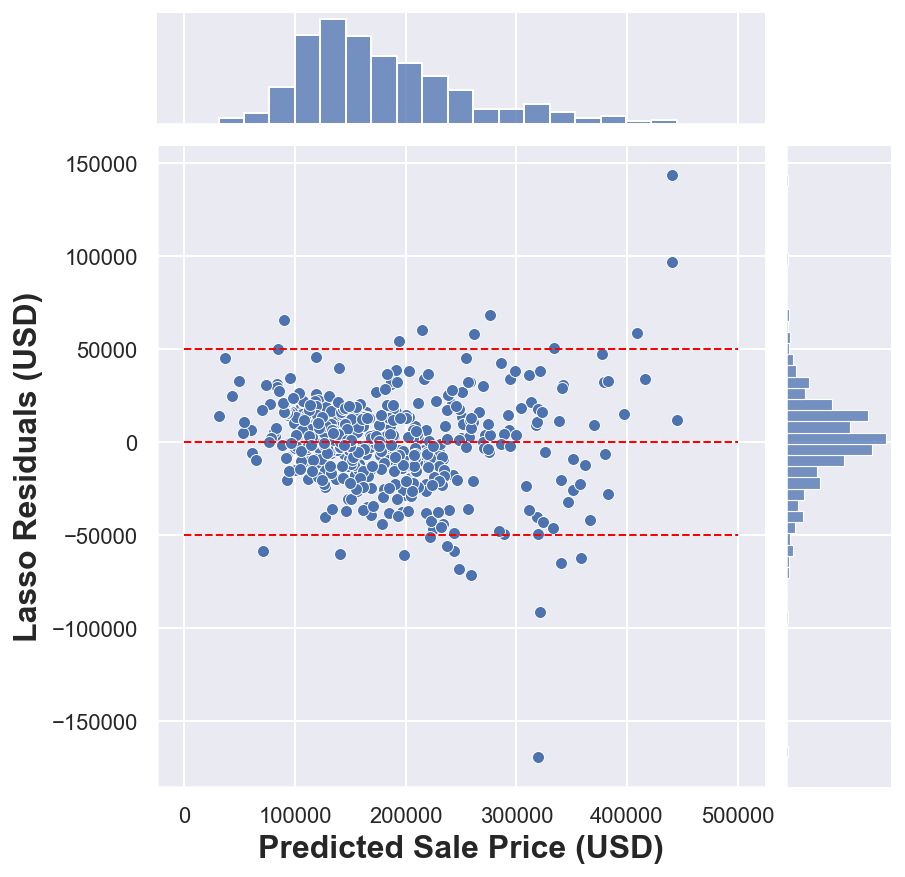

In [90]:
# Plot residuals of lasso reg predictions and its residuals
lasso_residual_plot = sns.jointplot(lasso_predict, lasso_residual)
lasso_residual_plot.set_axis_labels('Predicted Sale Price (USD)', 'Lasso Residuals (USD)', 
                                    fontsize = 16, fontweight = 'bold')

# Plot the bands and the 0-line
lasso_residual_plot.ax_joint.plot([0, 500000], [0, 0], color = 'red', linewidth = 1, linestyle = 'dashed')
lasso_residual_plot.ax_joint.plot([0, 500000], [50000, 50000], color = 'red', linewidth = 1, linestyle = 'dashed')
lasso_residual_plot.ax_joint.plot([0, 500000], [-50000, -50000], color = 'red', linewidth = 1, linestyle = 'dashed')

**INTEPRETATIONS**:
- A well-behaved residuals vs. predictor will bounce randomly and form a roughly horizontal band around the residual = 0 line, and no data points will stand out from the basic random pattern of the other residuals, i.e. **homoscedastic** or **homogeneity of variance**.
- The points are generally well-behaved within a ± USD 50,000 horizontal band for Predicted Sale Price up to approximately USD 300,000 before starting to form a funnel-like shape with the funnel's broader opening on the right as Predicted Sale Price increases. The occurrence of this funnel shape indicates [**heteroskedasticity** (or **heteroscedasticity**)](https://en.wikipedia.org/wiki/Homoscedasticity_and_heteroscedasticity), i.e. variance of Lasso Residuals increase as Predicted Sale Price increases.  
- The histogram for Predicted Sale Price has a positively- or right-skewed distribution (i.e. long right tail) whereas that for Lasso Residuals has a distribution of approximately zero skewness, with most of the points concentrating around the origin (0,0).
- All these imply the Lasso Regression model's greater accuracy in predicting lower priced property sales. The issue could potentially be alleviated as more data points of larger property sales are captured and included to further refine the model.

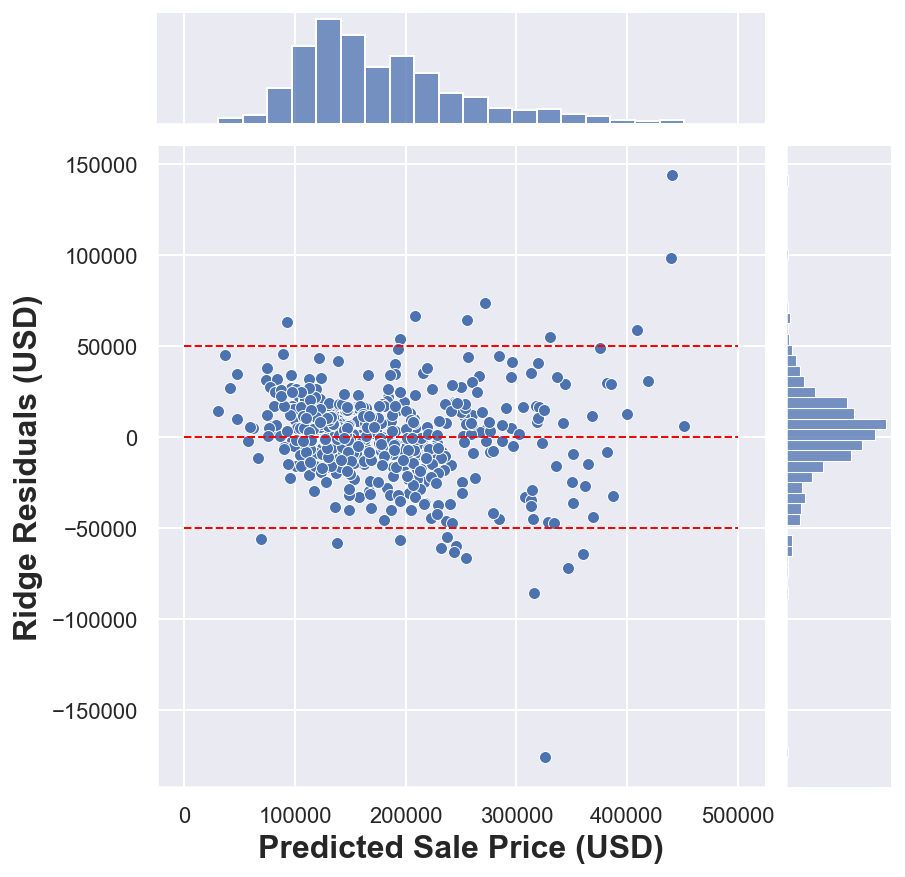

In [91]:
# Plot residuals of ridge reg predictions and its residuals
ridge_residual_plot = sns.jointplot(ridge_predict, ridge_residual)
ridge_residual_plot.set_axis_labels('Predicted Sale Price (USD)', 'Ridge Residuals (USD)', 
                                    fontsize = 16, fontweight = 'bold')

# Plot the bands and the 0-line
ridge_residual_plot.ax_joint.plot([0, 500000], [0, 0], color = 'red', linewidth = 1, linestyle = 'dashed')
ridge_residual_plot.ax_joint.plot([0, 500000], [50000, 50000], color = 'red', linewidth = 1, linestyle = 'dashed')
ridge_residual_plot.ax_joint.plot([0, 500000], [-50000, -50000], color = 'red', linewidth = 1, linestyle = 'dashed');

**INTEPRETATIONS**:
- Similar to the discussion for the Lasso Regression Model above, a well-behaved residuals vs. predictor will bounce randomly and form a roughly horizontal band around the residual = 0 line, and no data points will stand out from the basic random pattern of the other residuals, i.e. **homoscedastic** or **homogeneity of variance**.
- The points are generally well-behaved within a ± USD 50,000 horizontal band for Predicted Sale Price up to approximately USD 300,000 before starting to form a funnel-like shape with the funnel's broader opening on the right as Predicted Sale Price increases. The occurrence of this funnel shape indicates [**heteroskedasticity** (or **heteroscedasticity**)](https://en.wikipedia.org/wiki/Homoscedasticity_and_heteroscedasticity), i.e. variance of Ridge Residuals increase as Predicted Sale Price increases.  
- The histogram for Predicted Sale Price has a positively- or right-skewed distribution (i.e. long right tail) whereas that for Ridge Residuals has a distribution of approximately zero skewness, with most of the points concentrating around the origin (0,0).
- All these imply the Ridge Regression model's greater accuracy in predicting lower priced property sales. The issue could potentially be alleviated as more data points of larger property sales are captured and included to further refine the model.

### Assumptions of Linear Regression

There are [**4 assumptions**](https://sphweb.bumc.bu.edu/otlt/MPH-Modules/BS/R/R5_Correlation-Regression/R5_Correlation-Regression7.html) associated with a linear regression model:
 - **Linearity**: The relationship between X and the mean of Y is linear.
   - From the plot of residuals (X) vs predicted values (Y) for both Lasso and Ridge regressions, we observed that the residues are not too far away from 0 for Predicted Sale Price up to approximately USD 300,000. Residuals start diverging for Predicted Sale Prices above USD 300,000.
 - **Homoscedasticity**: The variance of residual is the same for any value of X.
   - From these plot of residuals (X) vs predicted values (Y) again, we observed the residues appeared randomly and spread equally around the y = 0 line for Predicted Sale Price up to approximately USD 300,000. Residuals start diverging for Predicted Sale Prices above USD 300,000.
 - **Independence**: Observations are independent of each other.
   - During Exploratory Data Analysis (EDA) of both numerical and categorical variables, we tried to remove selected variables that exhibited relatively high collinearity.
 - **Normality**: For any fixed value of X, Y is normally distributed.
   - As discussed at Standard Scaling Variables section above, we assumed the observations fit a Gaussian/Normal distribution (bell curve) with a well-behaved mean and standard deviation. Since the Train dataset (n = 2029) or sample size is sufficiently large (usually n > 30), the [Central Limit Theorem](https://sphweb.bumc.bu.edu/otlt/mph-modules/bs/bs704_probability/BS704_Probability12.html) applies and the distribution of the sample means will be approximately normally distributed regardless of whether the source population is normal or skewed.

Thus, the linear regression model should perform reasonably well for Predicted Sale Prices up to approximately USD 300,000 before potential performance deterioration sets in for Predicted Sale Prices above approximately USD 300,000.

### Summary of Metrics

In [92]:
# Higher is better
print('Ordinary Least Squares (OLS) Model Validation R² ≈', lr_val_r2)
print('Lasso Regression Model Validation R² ≈', lasso_val_r2)
print('Ridge Regression Model Validation R² ≈', ridge_val_r2)
print('\n')
# Lower is better
print('Ordinary Least Squares (OLS) Model Validation RMSE ≈', lr_val_rmse)
print('Lasso Regression Model Validation RMSE ≈', lasso_val_rmse)
print('Ridge Regression Model Validation RMSE ≈', ridge_val_rmse)

Ordinary Least Squares (OLS) Model Validation R² ≈ -6.3538659286791995e+22
Lasso Regression Model Validation R² ≈ 0.898834
Ridge Regression Model Validation R² ≈ 0.898019


Ordinary Least Squares (OLS) Model Validation RMSE ≈ 1.9293147035034548e+16
Lasso Regression Model Validation RMSE ≈ 24344.481732
Ridge Regression Model Validation RMSE ≈ 24442.337721


Given the extremely large error values for both validation R² and validation RMSE, the OLS model will not be a candidate model.

Since the Lasso Regression model has both a higher validation R² and a lower validation RMSE than the Ridge Regression model, the **`Lasso Regression model`** is chosen as the production model.

### Retrain Combined Train & Validation datasets using Lasso Regression Model 

In general, the performance of a machine learning model often improves with dataset size for predictive modeling. ([Source](https://machinelearningmastery.com/sensitivity-analysis-of-dataset-size-vs-model-performance/)) Additionally, if such a relationship does exist, there may be a point or points of diminishing returns where adding more data may not improve model performance or where datasets are too small to effectively capture the capability of a model at a larger scale. This depends on the specific dataset(s) and on the choice of model.

Specifically, we need enough examples of the problem to learn a useful approximation of the unknown underlying mapping function. Since we almost never have an abundance of or too much training data, we retrain our chosen `Lasso Regression Model` on the **combined Train and Validation datasets** to maximise the use of available data and to potentially avoid overfitting the statistical noise present in the training dataset.

In [93]:
# Create copy of Combined Train & Validation datasets
X1 = X.copy(deep = True)

# Use the "fit_transform" function to standardize the X design matrix
ss = StandardScaler()
ss.fit(X1)
X1 = ss.transform(X1)

#### Find updated optimal Lasso Regression alpha

In [94]:
# Find optimal value for Lasso Regression alpha using LassoCV
new_optimal_lasso = LassoCV(n_alphas = 500, cv = 10, verbose = 1)

In [95]:
# Fit on the combined Train & Validation datasets to retrieve updated optimal alpha
new_optimal_lasso.fit(X1, y)

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
.......................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................

LassoCV(cv=10, n_alphas=500, verbose=1)

In [96]:
print(new_optimal_lasso.alpha_)

140.61044018738534


#### Lasso Regression Model Retraining

In [97]:
# Instantiate Lasso Regression Model, using the updated optimal alpha
new_lasso = Lasso(alpha = new_optimal_lasso.alpha_)

In [98]:
# Fit Lasso Regression Model with updated optimal alpha on combined Train & Validation datasets
new_lasso.fit(X1, y)

Lasso(alpha=140.61044018738534)

In [99]:
# Calculate Lasso Regression Model's updated R² score
lasso_predict = new_lasso.predict(X1)
lasso_r2 = round(metrics.r2_score(y, lasso_predict), 6)
print('Lasso Train R² ≈', lasso_train_r2)
print('Lasso Validation R² ≈', lasso_val_r2)
print('\n')
print('Lasso R² ≈', lasso_r2)

Lasso Train R² ≈ 0.919832
Lasso Validation R² ≈ 0.898834


Lasso R² ≈ 0.917846


R² remained relatively unchange for the combined Train & Validation datasets.

In [100]:
# Lasso Regression Model updated 10-folds Cross Validation Score
new_lasso_score = cross_val_score(new_lasso, X1, y, scoring = 'neg_mean_squared_error', cv = 10).mean()
lasso_rmse = round(np.sqrt(-1 * new_lasso_score), 6)
print ('Lasso Train RMSE ≈', lasso_train_rmse)
print('Lasso Validation RMSE ≈', lasso_val_rmse)
print('\n')
print ('Lasso RMSE ≈', lasso_rmse)

Lasso Train RMSE ≈ 25449.849002
Lasso Validation RMSE ≈ 24344.481732


Lasso RMSE ≈ 24803.736226


RMSE improved slightly from 25449.849002 for the original Train dataset to 24803.736226 for the combined Train & Validation datasets.

### Coefficient Analysis of Lasso Regression Model

In [101]:
# Display the Lasso Regression coefficients in decreasing order of magnitude
lasso_coeffs = pd.DataFrame({'Variable': X.columns,                       # Store all predictors' column names
                            'Coefficient': lasso.coef_,                   # Store coefficients of predictors
                            'Absolute Coefficient': np.abs(lasso.coef_)}) # Store absolute coefficients of predictors

# The higher the value, the greater the impact of the variable on saleprice
lasso_coeffs.sort_values('Absolute Coefficient', inplace = True, ascending = False)

lasso_coeffs

,Variable,Coefficient,Absolute Coefficient
17,total_pty_sf,31107.75,31107.75
3,overall_qual,14336.84,14336.84
24,ms_subclass_20,7535.86,7535.86
5,bsmtfin_sf_1,7349.48,7349.48
69,neighborhood_StoneBr,7038.89,7038.89
123,bsmt_qual_5,6987.00,6987.00
63,neighborhood_NridgHt,6428.62,6428.62
11,kitchen_qual,6253.35,6253.35
29,ms_subclass_60,5674.04,5674.04
4,mas_vnr_area,5617.41,5617.41


Text(0, 0.5, 'Variable')

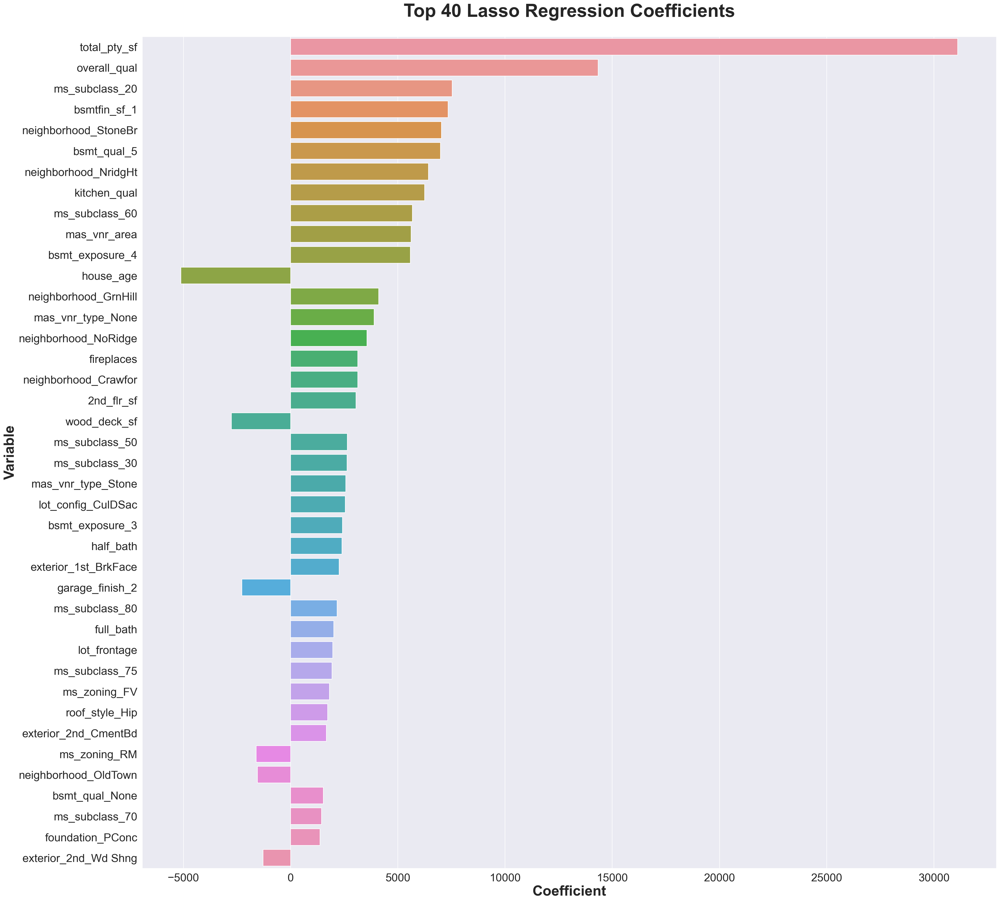

In [102]:
# Plot the Top 40 Lasso Regression coefficients
lasso_coeffs_strong = lasso_coeffs.loc[lasso_coeffs['Absolute Coefficient'] > 1275]

plt.rcParams['axes.labelsize'] = 28
fig, axes = plt.subplots(nrows = 1, ncols = 1, figsize = (30, 30))

fig = sns.barplot(x = 'Coefficient', y = 'Variable', data = lasso_coeffs_strong, orient = 'h')

fig.set_title('Top 40 Lasso Regression Coefficients', 
              y = 1.02, fontsize = 36, fontweight = 'bold')
axes.tick_params(axis = 'both', which = 'major', labelsize = 22)
axes.set_xlabel(axes.get_xlabel(), fontdict = {'weight': 'bold'})
axes.set_ylabel(axes.get_ylabel(), fontdict = {'weight': 'bold'})

**INTEPRETATIONS**:
- The top 5 Lasso variables having the greatest impact on `'saleprice'` [Sale Price] and their corresponding coefficients are as follows:
  - `'total_pty_sf'` [Total Property Area in Square Feet]: **31107.75**
  - `'overall_qual'` [Overall Material and Finish Quality of House]: **14336.84**
  - `'ms_subclass_20'` [1-Story 1946 & Newer All Styles House]: **7535.86**
  - `'bsmtfin_sf_1'` [Type 1 Finished Square Feet]: **7349.48**
  - `'neighborhood_StoneBr'` [Stone Brook Neighborhood in Ames, Iowa]: **7038.89**
- Variables such as `'house_age'` [Age of House at Year of Sale] are reasonably expected to be negatively correlated with `'saleprice'` [Sale Price] since most buyers prefer and are more willing to pay a premium on newer properties.
- Lasso Regression deals primarily with the feature selection of valuable variables, eliminating ones that are not useful. This also takes care of multicollinearity, but in a different way: it will choose the "best" of the correlated variables and zero-out the other redundant ones. There may also be useless variables in the data which it is simply getting rid of entirely, such as `'id'`.

## Repeat Data Cleaning for Test dataset
---

In [103]:
train.head()

,id,ms_subclass,ms_zoning,lot_frontage,lot_shape,lot_config,neighborhood,house_style,overall_qual,roof_style,exterior_1st,exterior_2nd,mas_vnr_type,mas_vnr_area,foundation,bsmt_qual,bsmt_exposure,bsmtfin_type_1,bsmtfin_sf_1,heating_qc,2nd_flr_sf,bsmt_full_bath,full_bath,half_bath,kitchen_qual,totrms_abvgrd,fireplaces,fireplace_qu,garage_type,garage_finish,garage_cars,wood_deck_sf,open_porch_sf,mo_sold,saleprice,total_pty_sf,garage_age,house_age
0,109,60,RL,79.13,2,CulDSac,Sawyer,2Story,6,Gable,HdBoard,Plywood,BrkFace,289.0,CBlock,3,1,6,533.0,5,754,0.0,2,1,4,6,0,None,Attchd,2,2.0,0,44,3,130500,2723.0,34.0,5
1,544,60,RL,43.00,2,CulDSac,SawyerW,2Story,7,Gable,VinylSd,VinylSd,BrkFace,132.0,PConc,4,1,6,637.0,5,1209,1.0,2,1,4,8,1,3,Attchd,2,2.0,0,74,4,220000,3668.0,12.0,12
2,153,20,RL,68.00,3,Inside,NAmes,1Story,5,Gable,VinylSd,VinylSd,None,0.0,CBlock,3,1,6,731.0,3,0,1.0,1,0,4,5,0,None,Detchd,1,1.0,0,52,1,109000,2412.0,57.0,3
3,318,60,RL,73.00,3,Inside,Timber,2Story,5,Gable,VinylSd,VinylSd,None,0.0,PConc,4,1,1,0.0,4,700,0.0,2,1,3,7,0,None,BuiltIn,3,2.0,100,0,4,174000,2328.0,3.0,3
4,255,50,RL,82.00,2,Inside,SawyerW,1.5Fin,6,Gable,Wd Sdng,Plywood,None,0.0,PConc,2,1,1,0.0,3,614,0.0,2,0,3,6,0,None,Detchd,1,2.0,0,59,3,138500,2664.0,53.0,17


### Data Import - Test Dataset

In [104]:
# Import Test dataset, rename column names and display number of rows & columns
test = pd.read_csv('../datasets/test.csv')
rename_col(test)
test.rename(columns = {'year_remod/add': 'year_remod'}, inplace = True)
test.shape

(878, 80)

In [105]:
# Display first 5 rows of Test dataset
test.head()

,id,pid,ms_subclass,ms_zoning,lot_frontage,lot_area,street,alley,lot_shape,land_contour,utilities,lot_config,land_slope,neighborhood,condition_1,condition_2,bldg_type,house_style,overall_qual,overall_cond,year_built,year_remod,roof_style,roof_matl,exterior_1st,exterior_2nd,mas_vnr_type,mas_vnr_area,exter_qual,exter_cond,foundation,bsmt_qual,bsmt_cond,bsmt_exposure,bsmtfin_type_1,bsmtfin_sf_1,bsmtfin_type_2,bsmtfin_sf_2,bsmt_unf_sf,total_bsmt_sf,heating,heating_qc,central_air,electrical,1st_flr_sf,2nd_flr_sf,low_qual_fin_sf,gr_liv_area,bsmt_full_bath,bsmt_half_bath,full_bath,half_bath,bedroom_abvgr,kitchen_abvgr,kitchen_qual,totrms_abvgrd,functional,fireplaces,fireplace_qu,garage_type,garage_yr_blt,garage_finish,garage_cars,garage_area,garage_qual,garage_cond,paved_drive,wood_deck_sf,open_porch_sf,enclosed_porch,3ssn_porch,screen_porch,pool_area,pool_qc,fence,misc_feature,misc_val,mo_sold,yr_sold,sale_type
0,2658,902301120,190,RM,69.0,9142,Pave,Grvl,Reg,Lvl,AllPub,Inside,Gtl,OldTown,Norm,Norm,2fmCon,2Story,6,8,1910,1950,Gable,CompShg,AsbShng,AsbShng,None,0.0,TA,Fa,Stone,Fa,TA,No,Unf,0,Unf,0,1020,1020,GasA,Gd,N,FuseP,908,1020,0,1928,0,0,2,0,4,2,Fa,9,Typ,0,NaN,Detchd,1910.0,Unf,1,440,Po,Po,Y,0,60,112,0,0,0,NaN,NaN,NaN,0,4,2006,WD
1,2718,905108090,90,RL,NaN,9662,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,Sawyer,Norm,Norm,Duplex,1Story,5,4,1977,1977,Gable,CompShg,Plywood,Plywood,None,0.0,TA,TA,CBlock,Gd,TA,No,Unf,0,Unf,0,1967,1967,GasA,TA,Y,SBrkr,1967,0,0,1967,0,0,2,0,6,2,TA,10,Typ,0,NaN,Attchd,1977.0,Fin,2,580,TA,TA,Y,170,0,0,0,0,0,NaN,NaN,NaN,0,8,2006,WD
2,2414,528218130,60,RL,58.0,17104,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,Gilbert,Norm,Norm,1Fam,2Story,7,5,2006,2006,Gable,CompShg,VinylSd,VinylSd,None,0.0,Gd,TA,PConc,Gd,Gd,Av,GLQ,554,Unf,0,100,654,GasA,Ex,Y,SBrkr,664,832,0,1496,1,0,2,1,3,1,Gd,7,Typ,1,Gd,Attchd,2006.0,RFn,2,426,TA,TA,Y,100,24,0,0,0,0,NaN,NaN,NaN,0,9,2006,New
3,1989,902207150,30,RM,60.0,8520,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,OldTown,Norm,Norm,1Fam,1Story,5,6,1923,2006,Gable,CompShg,Wd Sdng,Wd Sdng,None,0.0,Gd,TA,CBlock,TA,TA,No,Unf,0,Unf,0,968,968,GasA,TA,Y,SBrkr,968,0,0,968,0,0,1,0,2,1,TA,5,Typ,0,NaN,Detchd,1935.0,Unf,2,480,Fa,TA,N,0,0,184,0,0,0,NaN,NaN,NaN,0,7,2007,WD
4,625,535105100,20,RL,NaN,9500,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,NAmes,Norm,Norm,1Fam,1Story,6,5,1963,1963,Gable,CompShg,Plywood,Plywood,BrkFace,247.0,TA,TA,CBlock,Gd,TA,No,BLQ,609,Unf,0,785,1394,GasA,Gd,Y,SBrkr,1394,0,0,1394,1,0,1,1,3,1,TA,6,Typ,2,Gd,Attchd,1963.0,RFn,2,514,TA,TA,Y,0,76,0,0,185,0,NaN,NaN,NaN,0,7,2009,WD


### Check for duplicated rows - Test Dataset

In [106]:
# Compare all rows in the Test dataset to check for duplicates
duplicate(test)

'This dataset has no duplicated rows.'

### Check for appropriate datatypes - Test Dataset

These datatypes conversions were done in the original Train dataset and will be replicated here.

In [107]:
# Change datatype for 4 columns 'ms_subclass', 'overall_qual', 'overall_cond', and 'mo_sold' to string instead
test = test.astype({'ms_subclass': str, 'overall_qual': str, 'overall_cond': str, 'mo_sold': str}, 
                   errors = 'raise')

# Verify datatype for these 4 columns have been changed
print(test['ms_subclass'].dtype)
print(test['overall_qual'].dtype)
print(test['overall_cond'].dtype)
print(test['mo_sold'].dtype)

object
object
object
object


### Check for missing/null values - Test Dataset

In [108]:
# Check Test dataset for nulls & display summary table in descending order (for columns with non-zero nulls only)
column_nulls(test)

This dataframe has 878 rows and 80 columns.
There are 19 columns with null values.


,Number of Nulls,% of Total
pool_qc,874,99.54
misc_feature,837,95.33
alley,820,93.39
fence,706,80.41
fireplace_qu,422,48.06
lot_frontage,160,18.22
garage_yr_blt,45,5.13
garage_finish,45,5.13
garage_qual,45,5.13
garage_cond,45,5.13


### Impute missing/null values - Test Dataset

In [109]:
# Impute null values of 'lot_frontage' by estimating using 
# the IterativeImputer that was fitted on the Train dataset previously
# it_imp = IterativeImputer(estimator = LinearRegression())
it_imp_train = it_imp.transform(test[['lot_area', 'lot_frontage']])
test[['lot_area', 'lot_frontage']] = pd.DataFrame(it_imp_train, 
                                                  columns = test[['lot_area', 'lot_frontage']].columns)
test['lot_frontage'].describe()

count    878.00
mean      70.69
std       26.29
min       21.00
25%       60.00
50%       69.00
75%       80.00
max      471.50
Name: lot_frontage, dtype: float64

In [110]:
# Verify that all null values for 'lot_frontage' column have been imputed
test[test['lot_frontage'].isnull()]

,id,pid,ms_subclass,ms_zoning,lot_frontage,lot_area,street,alley,lot_shape,land_contour,utilities,lot_config,land_slope,neighborhood,condition_1,condition_2,bldg_type,house_style,overall_qual,overall_cond,year_built,year_remod,roof_style,roof_matl,exterior_1st,exterior_2nd,mas_vnr_type,mas_vnr_area,exter_qual,exter_cond,foundation,bsmt_qual,bsmt_cond,bsmt_exposure,bsmtfin_type_1,bsmtfin_sf_1,bsmtfin_type_2,bsmtfin_sf_2,bsmt_unf_sf,total_bsmt_sf,heating,heating_qc,central_air,electrical,1st_flr_sf,2nd_flr_sf,low_qual_fin_sf,gr_liv_area,bsmt_full_bath,bsmt_half_bath,full_bath,half_bath,bedroom_abvgr,kitchen_abvgr,kitchen_qual,totrms_abvgrd,functional,fireplaces,fireplace_qu,garage_type,garage_yr_blt,garage_finish,garage_cars,garage_area,garage_qual,garage_cond,paved_drive,wood_deck_sf,open_porch_sf,enclosed_porch,3ssn_porch,screen_porch,pool_area,pool_qc,fence,misc_feature,misc_val,mo_sold,yr_sold,sale_type


In [111]:
# Impute null values to 'None' for categorical variables or 0 for numerical variable
test['mas_vnr_type'] = test['mas_vnr_type'].fillna('None')
test['mas_vnr_area'] = test['mas_vnr_area'].fillna(0.0)
test['bsmt_qual'] = test['bsmt_qual'].fillna('None')
#test['bsmt_cond'] = test['bsmt_cond'].fillna('None')
test['bsmt_exposure'] = test['bsmt_exposure'].fillna('None')
test['bsmtfin_type_1'] = test['bsmtfin_type_1'].fillna('None')
#test['bsmtfin_type_2'] = test['bsmtfin_type_2'].fillna('None')
test['fireplace_qu'] = test['fireplace_qu'].fillna('None')
test['garage_type'] = test['garage_type'].fillna('None')
test['garage_finish'] = test['garage_finish'].fillna('None')
#test['garage_qual'] = test['garage_qual'].fillna('None')
#test['garage_cond'] = test['garage_cond'].fillna('None')

# Impute null value in 'garage_yr_blt' to the same value in the corresponding 'yr_sold' column
test['garage_yr_blt'].fillna(test['yr_sold'], inplace = True)

In [112]:
# Check Test dataset for nulls & display summary table in descending order (for columns with non-zero nulls only)
column_nulls(test)

This dataframe has 878 rows and 80 columns.
There are 9 columns with null values.


,Number of Nulls,% of Total
pool_qc,874,99.54
misc_feature,837,95.33
alley,820,93.39
fence,706,80.41
garage_qual,45,5.13
garage_cond,45,5.13
bsmt_cond,25,2.85
bsmtfin_type_2,25,2.85
electrical,1,0.11


> All 9 columns above with null values yet to be imputed will eventually be dropped, similar to the Train dataset. Thus, all columns with null values requiring imputation have been processed.

### Feature Engineering - Test Dataset

In [113]:
# Create new column ['total_pty_sf'] for total property area in square feet
# Total Bsmt SF (Continuous): Total square feet of basement area
# Gr Liv Area (Continuous): Above grade (ground) living area square feet
# Garage Area (Continuous): Size of garage in square feet
# Wood Deck SF (Continuous): Wood deck area in square feet
# Open Porch SF (Continuous): Open porch area in square feet
# Enclosed Porch (Continuous): Enclosed porch area in square feet
# 3-Ssn Porch (Continuous): Three season porch area in square feet
# Screen Porch (Continuous): Screen porch area in square feet
# Pool Area (Continuous): Pool area in square feet
test['total_pty_sf'] = (test['total_bsmt_sf'] + test['gr_liv_area'] + test['garage_area'] + 
                        test['wood_deck_sf'] + test['open_porch_sf'] + test['enclosed_porch'] + 
                        test['3ssn_porch'] + test['screen_porch'] + test['pool_area'])

# Create new column ['garage_age'] for age of garage at year of sale
# Yr Sold (Discrete): Year Sold (YYYY)
# Garage Yr Blt (Discrete): Year garage was built
test['garage_age'] = test['yr_sold'] - test['garage_yr_blt']

# Create new column ['house_age'] for age of house at year of sale
# Yr Sold (Discrete): Year Sold (YYYY)
# Year Remod/Add (Discrete): Remodel date (same as construction date if no remodeling or additions)
# Year Built (Discrete): Original construction date
test['house_age'] = test['yr_sold'] - (test[['year_remod', 'year_built']].max(axis = 1))

#### Sanity Check

In [114]:
# Verify all numerical variables have counts, means, standard deviations, mininum & maximum values that are logical
num_vars = get_num_var(test)
#num_vars.remove('saleprice')
for variable in num_vars:
    print(test[variable].describe(), '\n')

count     878.00
mean     1444.75
std       850.84
min         2.00
25%       692.25
50%      1433.00
75%      2197.50
max      2928.00
Name: id, dtype: float64 

count    8.78e+02
mean     7.16e+08
std      1.89e+08
min      5.26e+08
25%      5.28e+08
50%      5.35e+08
75%      9.07e+08
max      1.01e+09
Name: pid, dtype: float64 

count    878.00
mean      70.69
std       26.29
min       21.00
25%       60.00
50%       69.00
75%       80.00
max      471.50
Name: lot_frontage, dtype: float64 

count       878.00
mean      10307.03
std       10002.67
min        1477.00
25%        7297.25
50%        9446.00
75%       11589.00
max      215245.00
Name: lot_area, dtype: float64 

count     878.00
mean     1970.49
std        30.40
min      1880.00
25%      1954.00
50%      1972.00
75%      1999.75
max      2010.00
Name: year_built, dtype: float64 

count     878.00
mean     1984.42
std        20.45
min      1950.00
25%      1967.00
50%      1992.00
75%      2003.00
max      2010.00
Name: ye

#### Preprocessing ordinal categorical variables — Integer Encoding - Test dataset

In [115]:
# Impute these 11 ordinal categorical columns with the corresponding mapping
# 'lot_shape', 'overall_qual', 'overall_cond', 'exter_qual', 'bsmt_qual', 'bsmt_exposure', 
# 'bsmtfin_type_1', 'heating_qc', 'kitchen_qual', 'fireplace_qu', 'garage_finish'
# (Smaller number = Worse ; Larger number = Better)

# 'NaN': 0
# Po (Poor): 1
# Fa (Fair): 2
# TA (Typical/Average): 3
# Gd (Good): 4
# Ex (Excellent): 5

test = test.replace({'bsmt_qual' : {'NaN' : 0, 'Po' : 1, 'Fa' : 2, 'TA' : 3, 'Gd' : 4, 'Ex' : 5}, 
                     'fireplace_qu' : {'NaN' : 0, 'Po' : 1, 'Fa' : 2, 'TA' : 3, 'Gd' : 4, 'Ex' : 5}, 
                     'heating_qc' : {'Po' : 1, 'Fa' : 2, 'TA' : 3, 'Gd' : 4, 'Ex' : 5}, 
                     'kitchen_qual' : {'NaN' : 0, 'Po' : 1, 'Fa' : 2, 'TA' : 3, 'Gd' : 4, 'Ex' : 5}})

# Very Poor: 1
# Poor: 2
# Fair: 3
# Below Average: 4 
# Average: 5
# Above Average: 6
# Good: 7
# Very Good: 8
# Excellent: 9
# Very Excellent: 10

# Change datatype for 2 columns 'overall_qual' and 'overall_cond' to integer instead
test = test.astype({'overall_qual': int}, errors = 'raise')

# IR3 (Irregular): 0
# IR2 (Moderately Irregular): 1
# IR1 (Slightly irregular): 2
# Reg (Regular): 3

test = test.replace({'lot_shape' : {'IR3' : 0, 'IR2' : 1, 'IR1' : 2, 'Reg' : 3}})

# ELO (Electricity only): 0
# NoSeWa (Electricity & Gas Only): 1
# NoSewr (Electricity, Gas, & Water (Septic Tank)): 2
# AllPub (All public Utilities (E,G,W,& S)): 3

test = test.replace({'bsmt_exposure' : {'NaN' : 0, 'No' : 1, 'Mn' : 2, 'Av' : 3, 'Gd' : 4}})

# NA (No Basement): 0
# Unf (Unfinished): 1
# LwQ (Low Quality): 2
# Rec (Average Rec Room): 3
# BLQ (Below Average Living Quarters): 4
# ALQ (Average Living Quarters): 5
# GLQ (Good Living Quarters): 6

test = test.replace({'bsmtfin_type_1' : {'NaN' : 0, 'Unf' : 1, 'LwQ' : 2, 
                                         'Rec' : 3, 'BLQ' : 4, 'ALQ' : 5, 'GLQ' : 6}})

# Mix (Mixed): 0
# FuseP (Poor): 1
# FuseF (Fair): 2
# FuseA (Average): 3
# SBrkr (Standard Circuit Breakers): 4

test = test.replace({'garage_finish' : {'NaN' : 0, 'Unf' : 1, 'RFn' : 2, 'Fin' : 3}})

# N (Dirt/Gravel): 0
# P (Partial Pavement): 1
# Y (Paved): 2

#### Preprocessing nominal categorical variables — Dummy Variable Encoding - Test dataset

In [116]:
# Count the number of columns in the Test dataset that is absent from the Train dataset
len(test.columns.difference(train.columns))

46

In [117]:
# Verify that these 46 columns were the same ones that were dropped from Train dataset
# List the columns present in the Test dataset that is absent in the Train dataset
test.columns.difference(train.columns)

Index(['1st_flr_sf', '3ssn_porch', 'alley', 'bedroom_abvgr', 'bldg_type',
       'bsmt_cond', 'bsmt_half_bath', 'bsmt_unf_sf', 'bsmtfin_sf_2',
       'bsmtfin_type_2', 'central_air', 'condition_1', 'condition_2',
       'electrical', 'enclosed_porch', 'exter_cond', 'exter_qual', 'fence',
       'functional', 'garage_area', 'garage_cond', 'garage_qual',
       'garage_yr_blt', 'gr_liv_area', 'heating', 'kitchen_abvgr',
       'land_contour', 'land_slope', 'lot_area', 'low_qual_fin_sf',
       'misc_feature', 'misc_val', 'overall_cond', 'paved_drive', 'pid',
       'pool_area', 'pool_qc', 'roof_matl', 'sale_type', 'screen_porch',
       'street', 'total_bsmt_sf', 'utilities', 'year_built', 'year_remod',
       'yr_sold'],
      dtype='object')

In [118]:
# Drop these 46 columns from Test dataset
test = test.drop(test.columns.difference(train.columns), axis = 1)

In [119]:
# Reconfirm Test dataset has no null values
column_nulls(test)

This dataframe has 878 rows and 37 columns.
There are 0 columns with null values.


,Number of Nulls,% of Total


In [120]:
train.shape

(2029, 38)

In [121]:
# Confirm Test dataset has 1 less column ('saleprice') than Train dataset
test.shape

(878, 37)

In [122]:
# List the column(s) present in the Test dataset that is/are absent in the Train dataset
test.columns.difference(train.columns)

Index([], dtype='object')

In [123]:
# List the column(s) present in the Train dataset that is/are absent in the Test dataset
train.columns.difference(test.columns)

Index(['saleprice'], dtype='object')

In [124]:
# Convert each categorical columns into a one-hot encoded matrix
test_dum = pd.get_dummies(test, drop_first = False)
#test_dum['saleprice'] = 0.0

In [125]:
test_dum.dtypes

id                int64
lot_frontage    float64
lot_shape         int64
overall_qual      int32
mas_vnr_area    float64
                 ...   
mo_sold_5         uint8
mo_sold_6         uint8
mo_sold_7         uint8
mo_sold_8         uint8
mo_sold_9         uint8
Length: 173, dtype: object

In [126]:
train_dum.dtypes

id                        int64
lot_frontage            float64
lot_shape                 int64
overall_qual              int32
mas_vnr_area            float64
bsmtfin_sf_1            float64
heating_qc                int64
2nd_flr_sf                int64
bsmt_full_bath          float64
full_bath                 int64
half_bath                 int64
kitchen_qual              int64
totrms_abvgrd             int64
fireplaces                int64
garage_cars             float64
wood_deck_sf              int64
open_porch_sf             int64
saleprice                 int64
total_pty_sf            float64
garage_age              float64
house_age                 int64
ms_subclass_150           uint8
ms_subclass_160           uint8
ms_subclass_180           uint8
ms_subclass_190           uint8
ms_subclass_20            uint8
ms_subclass_30            uint8
ms_subclass_40            uint8
ms_subclass_45            uint8
ms_subclass_50            uint8
ms_subclass_60            uint8
ms_subcl

In [127]:
column_nulls(train_dum)

This dataframe has 2029 rows and 161 columns.
There are 0 columns with null values.


,Number of Nulls,% of Total


In [128]:
# Reconfirm dummified Test dataset has no null values
column_nulls(test_dum)

This dataframe has 878 rows and 173 columns.
There are 0 columns with null values.


,Number of Nulls,% of Total


In [129]:
# List the columns in the dummified Test dataset that are missing from the dummified Train dataset
test_dum.columns.difference(train_dum.columns)

Index(['bsmt_exposure_1', 'bsmt_qual_1', 'bsmtfin_type_1_1',
       'exterior_1st_AsbShng', 'exterior_1st_PreCast', 'exterior_2nd_AsbShng',
       'exterior_2nd_Other', 'exterior_2nd_PreCast', 'fireplace_qu_1',
       'foundation_BrkTil', 'garage_finish_1', 'garage_type_2Types',
       'house_style_1.5Fin', 'lot_config_Corner', 'mas_vnr_type_BrkCmn',
       'mas_vnr_type_CBlock', 'mo_sold_1', 'ms_subclass_120',
       'neighborhood_Blmngtn', 'roof_style_Flat'],
      dtype='object')

In [130]:
# Drop these 20 columns in the dummified Test dataset that are missing from the dummified Train dataset
test_dum = test_dum.drop(columns = ['bsmt_exposure_1', 'bsmt_qual_1', 'bsmtfin_type_1_1', 
                                    'exterior_1st_AsbShng', 'exterior_1st_PreCast', 'exterior_2nd_AsbShng', 
                                    'exterior_2nd_Other', 'exterior_2nd_PreCast', 'fireplace_qu_1', 
                                    'foundation_BrkTil', 'garage_finish_1', 'garage_type_2Types', 
                                    'house_style_1.5Fin', 'lot_config_Corner', 'mas_vnr_type_BrkCmn', 
                                    'mas_vnr_type_CBlock', 'mo_sold_1', 'ms_subclass_120', 
                                    'neighborhood_Blmngtn', 'roof_style_Flat'])

In [131]:
# List the columns in the dummified Train dataset that are missing from the dummified Test dataset
train_dum.columns.difference(test_dum.columns)

Index(['exterior_1st_CBlock', 'exterior_1st_ImStucc', 'exterior_1st_Stone',
       'exterior_2nd_Stone', 'ms_subclass_150', 'neighborhood_GrnHill',
       'neighborhood_Landmrk', 'saleprice'],
      dtype='object')

In [132]:
# Create list of 8 columns missing from dummified Test dataset
not_in_test = ['exterior_1st_CBlock', 'exterior_1st_ImStucc', 'exterior_1st_Stone', 'exterior_2nd_Stone', 
               'ms_subclass_150', 'neighborhood_GrnHill', 'neighborhood_Landmrk', 'saleprice']

# Create these 7 missing columns and fill these rows with 0 in the dummified Test dataset
for column in not_in_test:
    test_dum[column] = 0

# Reorder the columns in the dummified Test dataset to match that in the dummified Train dataset
test_dum = test_dum[train_dum.columns]

In [133]:
# Load in for each column only if it is numeric
#features = [col for col in test_dum._get_numeric_data().columns]
#X = test_dum[features]

x_features = [x for x in test_dum.columns if x != 'saleprice']
X_test = test_dum[x_features]

In [134]:
X_test

,id,lot_frontage,lot_shape,overall_qual,mas_vnr_area,bsmtfin_sf_1,heating_qc,2nd_flr_sf,bsmt_full_bath,full_bath,half_bath,kitchen_qual,totrms_abvgrd,fireplaces,garage_cars,wood_deck_sf,open_porch_sf,total_pty_sf,garage_age,house_age,ms_subclass_150,ms_subclass_160,ms_subclass_180,ms_subclass_190,ms_subclass_20,ms_subclass_30,ms_subclass_40,ms_subclass_45,ms_subclass_50,ms_subclass_60,ms_subclass_70,ms_subclass_75,ms_subclass_80,ms_subclass_85,ms_subclass_90,ms_zoning_C (all),ms_zoning_FV,ms_zoning_I (all),ms_zoning_RH,ms_zoning_RL,ms_zoning_RM,lot_config_CulDSac,lot_config_FR2,lot_config_FR3,lot_config_Inside,neighborhood_Blueste,neighborhood_BrDale,neighborhood_BrkSide,neighborhood_ClearCr,neighborhood_CollgCr,neighborhood_Crawfor,neighborhood_Edwards,neighborhood_Gilbert,neighborhood_Greens,neighborhood_GrnHill,neighborhood_IDOTRR,neighborhood_Landmrk,neighborhood_MeadowV,neighborhood_Mitchel,neighborhood_NAmes,...,exterior_2nd_BrkFace,exterior_2nd_CBlock,exterior_2nd_CmentBd,exterior_2nd_HdBoard,exterior_2nd_ImStucc,exterior_2nd_MetalSd,exterior_2nd_Plywood,exterior_2nd_Stone,exterior_2nd_Stucco,exterior_2nd_VinylSd,exterior_2nd_Wd Sdng,exterior_2nd_Wd Shng,mas_vnr_type_BrkFace,mas_vnr_type_None,mas_vnr_type_Stone,foundation_CBlock,foundation_PConc,foundation_Slab,foundation_Stone,foundation_Wood,bsmt_qual_2,bsmt_qual_3,bsmt_qual_4,bsmt_qual_5,bsmt_qual_None,bsmt_exposure_2,bsmt_exposure_3,bsmt_exposure_4,bsmt_exposure_None,bsmtfin_type_1_2,bsmtfin_type_1_3,bsmtfin_type_1_4,bsmtfin_type_1_5,bsmtfin_type_1_6,bsmtfin_type_1_None,fireplace_qu_2,fireplace_qu_3,fireplace_qu_4,fireplace_qu_5,fireplace_qu_None,garage_type_Attchd,garage_type_Basment,garage_type_BuiltIn,garage_type_CarPort,garage_type_Detchd,garage_type_None,garage_finish_2,garage_finish_3,garage_finish_None,mo_sold_10,mo_sold_11,mo_sold_12,mo_sold_2,mo_sold_3,mo_sold_4,mo_sold_5,mo_sold_6,mo_sold_7,mo_sold_8,mo_sold_9
0,2658,69.00,3,6,0.0,0,4,1020,0,2,0,2,9,0,1,0,60,3560,96.0,56,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0
1,2718,69.12,2,5,0.0,0,3,0,0,2,0,3,10,0,2,170,0,4684,29.0,29,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0
2,2414,58.00,2,7,0.0,554,5,832,1,2,1,4,7,1,2,100,24,2700,0.0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,1,0,0,0,1,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1
3,1989,60.00,3,5,0.0,0,3,0,0,1,0,3,5,0,2,0,0,2600,72.0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
4,625,68.70,2,6,247.0,609,4,0,1,1,1,3,6,2,2,0,76,3563,46.0,46,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
873,1662,80.00,3,6,0.0,931,3,793,1,2,1,3,8,1,2,0,96,3545,33.0,33,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0
874,

#### Standard Scaling variables - Test dataset

In [135]:
# Scale X_test using the same parameters set earlier
X_test = ss.transform(X_test)

#### Make predictions using Test dataset

In [136]:
# House Sales Price Prediction
lasso_pred = lasso.predict(X_test)

In [137]:
lasso_pred.shape

(878,)

In [138]:
test_dum['saleprice'] = lasso_pred

In [139]:
test_result = test_dum[['id', 'saleprice']]

In [140]:
test_result.head()

,id,saleprice
0,2658,144237.90
1,2718,165616.03
2,2414,196936.41
3,1989,116106.55
4,625,178236.69


#### Export Kaggle submission file

In [141]:
# Save the modified Test dataframe as a csv file into the same folder as the original data files
test_result.to_csv('../datasets/test_result.csv', index = False)

#### List the Maximum Sales Price in each Ames Neighbourhood based on Train dataset

In [142]:
# List the Maximum Sales Price in each Ames Neighbourhood based on Train dataset
#train.groupby(['neighborhood']).max().iloc[:,[-4]]
train[['neighborhood', 'saleprice']].groupby(['neighborhood']).max()

,saleprice
neighborhood,
Blmngtn,264561
Blueste,185000
BrDale,122500
BrkSide,223500
ClearCr,328000
CollgCr,475000
Crawfor,392500
Edwards,415000
Gilbert,377500


## Recommendations, Next Steps and Conclusion

With the aim of helping Ames homeowners determine the fair value of your property and identify ways to maximise your home sales prices, I cleaned, explored and analysed Ames Housing Dataset to develop 3 models (Linear Regression, Lasso Regression, and Ridge Regression), narrowing down to 1 production model (Lasso Regression) based on the lowest Root Mean Square Error (RMSE) to predict house sales prices for Ames homeowners and advice ways to maximise sales prices.

| **Neighbourhood**                     | **Maximum Sale Price (USD)** |
|---------------------------------------|------------------------------|
| Bloomington   Heights                 | 264,561                      |
| Bluestem                              | 185,000                      |
| Briardale                             | 122,500                      |
| Brookside                             | 223,500                      |
| Clear Creek                           | 328,000                      |
| College Creek                         | 475,000                      |
| Crawford                              | 392,500                      |
| Edwards                               | 415,000                      |
| Gilbert                               | 377,500                      |
| Greens                                | 206,000                      |
| Green Hills                           | 330,000                      |
| Iowa DOT and Rail Road                | 202,500                      |
| Landmark                              | 137,000                      |
| Meadow Village                        | 151,400                      |
| Mitchell                              | 300,000                      |
| North Ames                            | 345,000                      |
| Northridge                            | 155,000                      |
| Northpark Villa                       | 306,000                      |
| Northridge Heights                    | 584,500                      |
| Northwest Ames                        | 611,657                      |
| Old Town                              | 475,000                      |
| South & West of Iowa State University | 200,000                      |
| Sawyer                                | 219,000                      |
| Sawyer West                           | 320,000                      |
| Somerset                              | 468,000                      |
| Stone Brook                           | 591,587                      |
| Timberland                            | 425,000                      |
| Veenker                               | 385,000                      |

This Lasso Regression house sales prices model predicts the fair value of your Ames home. Additionally, with reference to the above table, I provided the maximum sales price for each Ames neighbourhood so you know the reasonable upper limit of the value of your priced home. 

I also identified the **top 40 factors** with the greatest impact on Ames home sales prices, with the top 5 listed below:
  - **`'total_pty_sf'`**: Total Property Area in Square Feet
  - **`'overall_qual'`**: Overall Material and Finish Quality of House
  - **`'ms_subclass_20'`**: 1-Story 1946 & Newer All Styles House
  - **`'bsmtfin_sf_1'`**: Type 1 Finished Square Feet
  - **`'neighborhood_StoneBr'`**: Stone Brook Neighborhood in Ames, Iowa

Top 3 tips for enhancing your Ames home sales value:
1. Maximise your total property area (i.e. Basement, above grade (ground) living area, garage, porch, pool, etc.)
2. Maintain good / excellent quality of house thru regular maintenance and upkeep of interior / exterior features
3. Apply excellent finishing for all areas of your property including the basement


### Next Steps:
With your continual strong support I aim to further enhance the robustness of this Lasso pricing model by:
- Exploring other pricing models;
- Continually updating both the data and model to ensure continually accuracy of home sales price and relevancy of strategic and tactic advice I provide to Ames homeowners;   
- Taking into consideration both macro- and micro-economic factors in my pricing model e.g. mortgage rates, crime rates, COVID-19, etc;
- etc.

## Conclusion:
I explored 3 and narrowed down to 1 production model (Lasso) based on the lowest Root Mean Square Error (RMSE) to predict house sales prices for Ames homeowners and advice ways to maximise sales prices as your data-driven property consultant. 

I also shared the maximum sales price by neighbourhood, top 5 factors with the greatest impact on Ames home sales prices, and top 3 tips for enhancing your Ames home sales value.

With your continual strong support I aim to further enhance the robustness of this pricing model and provide you with continual data-backed advice that maximises the sales value of your priced home.